# Time Series Analysis - Final Project

Omer Eyal - 315044636

## Import libraries and data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import warnings
import scipy
# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
import seaborn as sns
sns.set_theme(style="ticks", font_scale=1.5)  # white graphs, with large and legible letters
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.stattools import adfuller
from scipy.signal import find_peaks
from scipy import signal
from ipywidgets import interact, IntSlider
from IPython.display import display, HTML
import statsmodels.api as sm
%matplotlib widget

In [2]:
filename = "FLX_BR-Sa1_FLUXNET2015_SUBSET_HR_2002-2011_1-4.csv" # dataset's filename
data_types = {'TIMESTAMP_START': str , 'TIMESTAMP_END':str} # change Timestamp to srting
df = pd.read_csv(filename, dtype=data_types, na_values=-9999) # read csv, assign -9999 as nan values

df.rename(columns={'TA_F': 'temperature', 'TA_F_QC': 'temperature_flag',
                   'VPD_F': 'VPD', 'VPD_F_QC': 'VPD_flag', 'P_F': 'precipitation', 'P_F_QC': 'precipitation_flag',
                    'NEE_VUT_REF': 'NEE', 'NEE_VUT_REF_QC': 'NEE_flag'}, inplace=True) # Rename relevant columns to more convenient names

df['date'] = pd.to_datetime(df['TIMESTAMP_START']) # change 
df = df.set_index('date')
df

,TIMESTAMP_START,TIMESTAMP_END,temperature,temperature_flag,SW_IN_POT,SW_IN_F,SW_IN_F_QC,LW_IN_F,LW_IN_F_QC,VPD,...,RECO_DT_VUT_REF,RECO_DT_VUT_25,RECO_DT_VUT_50,RECO_DT_VUT_75,GPP_DT_VUT_REF,GPP_DT_VUT_25,GPP_DT_VUT_50,GPP_DT_VUT_75,RECO_SR,RECO_SR_N
date,,,,,,,,,,,,,,,,,,,,,
2002-01-01 00:00:00,200201010000,200201010100,24.478,1,0.0,0.0,0,413.409,2,8.150,...,6.16063,6.10217,8.42319,9.12301,0.0,0.0,0.0,0.0,NaN,NaN
2002-01-01 01:00:00,200201010100,200201010200,24.442,1,0.0,0.0,0,413.409,2,7.270,...,6.14280,6.08451,8.39881,9.09661,0.0,0.0,0.0,0.0,NaN,NaN
2002-01-01 02:00:00,200201010200,200201010300,24.400,1,0.0,0.0,0,417.747,2,7.610,...,6.12204,6.06395,8.37042,9.06586,0.0,0.0,0.0,0.0,NaN,NaN
2002-01-01 03:00:00,200201010300,200201010400,24.358,1,0.0,0.0,0,417.747,2,5.760,...,6.10132,6.04343,8.34210,9.03518,0.0,0.0,0.0,0.0,NaN,NaN
2002-01-01 04:00:00,200201010400,200201010500,24.318,1,0.0,0.0,0,417.747,2,5.110,...,6.08163,6.02392,8.31518,9.00602,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-31 19:00:00,201112311900,201112312000,25.243,1,0.0,0.0,0,414.885,2,4.916,...,11.29670,6.31781,9.24761,11.24390,0.0,0.0,0.0,0.0,NaN,NaN
2011-12-31 20:00:00,201112312000,201112312100,25.239,1,0.0,0.0,0,413.376,2,4.921,...,11.29590,6.31744,9.24647,11.24330,0.0,0.0,0.0,0.0,NaN,NaN
2011-12-31 21:00:00,201112312100,201112312200,25.239,1,0.0,0.0,0,413.376,2,4.937,...,11.29590,6.31744,9.24647,11.24330,0.0,0.0,0.0,0.0,NaN,NaN


In [3]:
# Function for plotting the columns of a dataframe
def plot_all_columns(data):
    
    column_list = data.columns
    n = len(column_list)
    fig, ax = plt.subplots(len(column_list),1, sharex=True, figsize=(10,len(column_list)*2), constrained_layout=True)

    if len(column_list) == 1:
        ax.plot(data[column_list[0]])
        return
    
    labels = ['Temperature (°C)', 'VPD (hPa)', 'Preciptation (mm)', r"NEE $\left(\frac{\mu mol\, CO_2}{m^2\, s}\right)$"]

    # Generate distinct colors
    colors = plt.cm.Set3(np.linspace(0, 1, n))
    
    for i, (column, color) in enumerate(zip(column_list, colors)):
        ax[i].plot(data[column], color=color)
        ax[i].set_ylabel(labels[i]) 
    
    locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
    formatter = mdates.ConciseDateFormatter(locator)
    ax[i].xaxis.set_major_locator(locator)
    ax[i].xaxis.set_major_formatter(formatter)

    plt.tight_layout()
    return

In [4]:
# Filter only relevant columns
df1 = df[['temperature', 'VPD', 'precipitation', 'NEE']]

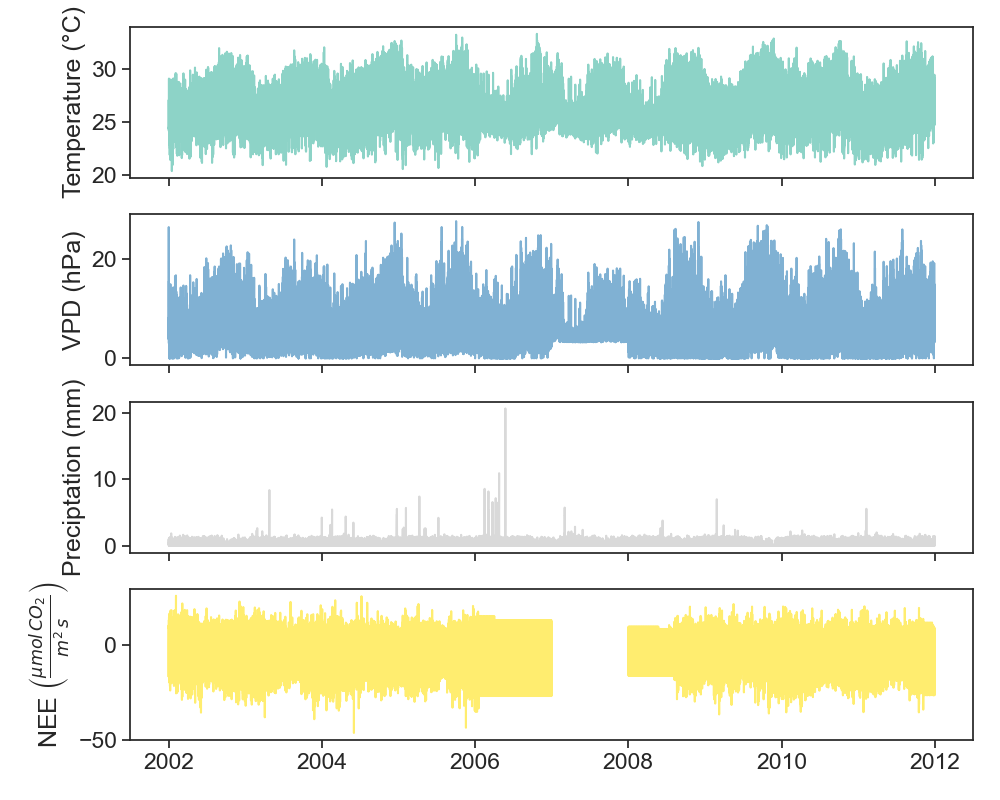

In [5]:
# Plotting
plot_all_columns(df1)

## Gap filling check

Firstly, I'll check the actual data that measured without any FLUXNET gap-filled data

In [6]:
only_measured = df[['temperature', 'temperature_flag', 'VPD', 'VPD_flag', 'precipitation', 'precipitation_flag', 'NEE', 'NEE_flag']].copy()


# Loop through each variable and apply filtering
for col in only_measured.filter(like='_flag'):
    value_col = col.replace('_flag', '')  # Get the corresponding value column
    only_measured[value_col] = only_measured[value_col].where(only_measured[col] == 0, np.nan)

# Drop flag columns
only_measured = only_measured.drop(columns=only_measured.filter(like='_flag'))

only_measured

,temperature,VPD,precipitation,NEE
date,,,,
2002-01-01 00:00:00,NaN,8.15,NaN,NaN
2002-01-01 01:00:00,NaN,7.27,NaN,NaN
2002-01-01 02:00:00,NaN,7.61,NaN,NaN
2002-01-01 03:00:00,NaN,5.76,NaN,NaN
2002-01-01 04:00:00,NaN,5.11,NaN,NaN
...,...,...,...,...
2011-12-31 19:00:00,NaN,NaN,NaN,NaN
2011-12-31 20:00:00,NaN,NaN,NaN,NaN
2011-12-31 21:00:00,NaN,NaN,NaN,NaN


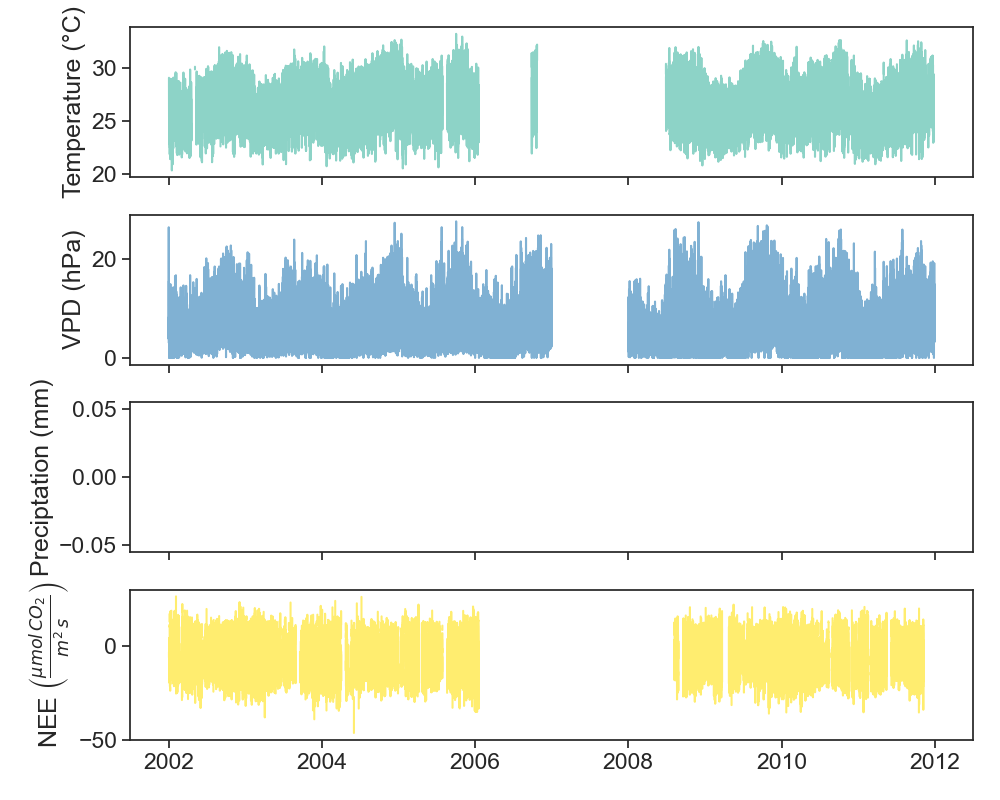

In [7]:
# plotting
plot_all_columns(only_measured)

In [8]:
# FIlter two columns for future investigation
only_measured = only_measured[['VPD', 'NEE']]

## Outliers

Detecting outliers with the rolling IQR method for the variables

In [9]:
# Function for detecting outliers thoruw rolling IQR window
def rolling_iqr_envelop(series, window_size=50, k=1.5):
    series.name = 'original'
    data = series.to_frame()
    # third quantile
    data['q3'] = data['original'].rolling(window_size, center=True, min_periods=1).quantile(0.75)
    # first quantile
    data['q1'] = data['original'].rolling(window_size, center=True, min_periods=1).quantile(0.25)
    # IQR
    IQR = data['q3']-data['q1']
    # finding the top and bottom threshold for each datapoint
    data['top'] = data['q3'] + k*IQR
    data['bottom'] = data['q1'] - k*IQR
    # creating a mask of booleans that places true if the row is an outliar and false if its not.
    data['outliers'] = ((data['original'] > data['top']) | (data['original'] < data['bottom']))
    # applying the mask and replacing all outliers with nans.
    data['filtered'] = np.where(data['outliers'],
                                np.nan,  # use this if outliers is True
                                data['original']) # otherwise
    return data['filtered']

### VPD & NEE

In [10]:
filtered_df = only_measured.copy() # make a copy of the dataframe

outliers = pd.DataFrame() # create a new dataframe for counting outliers
# apply the outliers function on each column
for column in filtered_df.columns:
    filtered_df[column + '_filtered'] = rolling_iqr_envelop(filtered_df[column], k=2)
    outliers[column] = [filtered_df[column + '_filtered'].isna().sum() - filtered_df[column].isna().sum()] # count the number of outliers for each column

In [11]:
outliers

,VPD,NEE
0,503,61


In [12]:
# function for plotting al the columns (original and filtered) of a dataframe
def plot_all_columns2(data):
    column_list = data.columns

    fig, ax = plt.subplots((int(len(column_list)/2)),1, sharex=True, figsize=(10,len(column_list)+5))

    if len(column_list) == 2:
        ax.plot(data[column_list[0]], color='orange', label='Original') # plot the original
        ax.plot(data[column_list[0] + '_filtered'], color='darkcyan', label='Filtered') # plot the filtered
        ax.set(ylabel=column_list[0])
        ax.legend()
        return
    for i, column in enumerate(column_list[:int(len(column_list)/2)]):
        ax[i].plot(data[column], label='Original', color='orange') # plot the original
        ax[i].plot(data[column + '_filtered'], label='Filtered', color='darkcyan') # plot the filtered
        ax[i].set(ylabel=column)
        
    ax[0].legend()
    # ax[0].set_title(title)

    locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
    formatter = mdates.ConciseDateFormatter(locator)
    ax[i].xaxis.set_major_locator(locator)
    ax[i].xaxis.set_major_formatter(formatter)

    
    plt.tight_layout()

    return

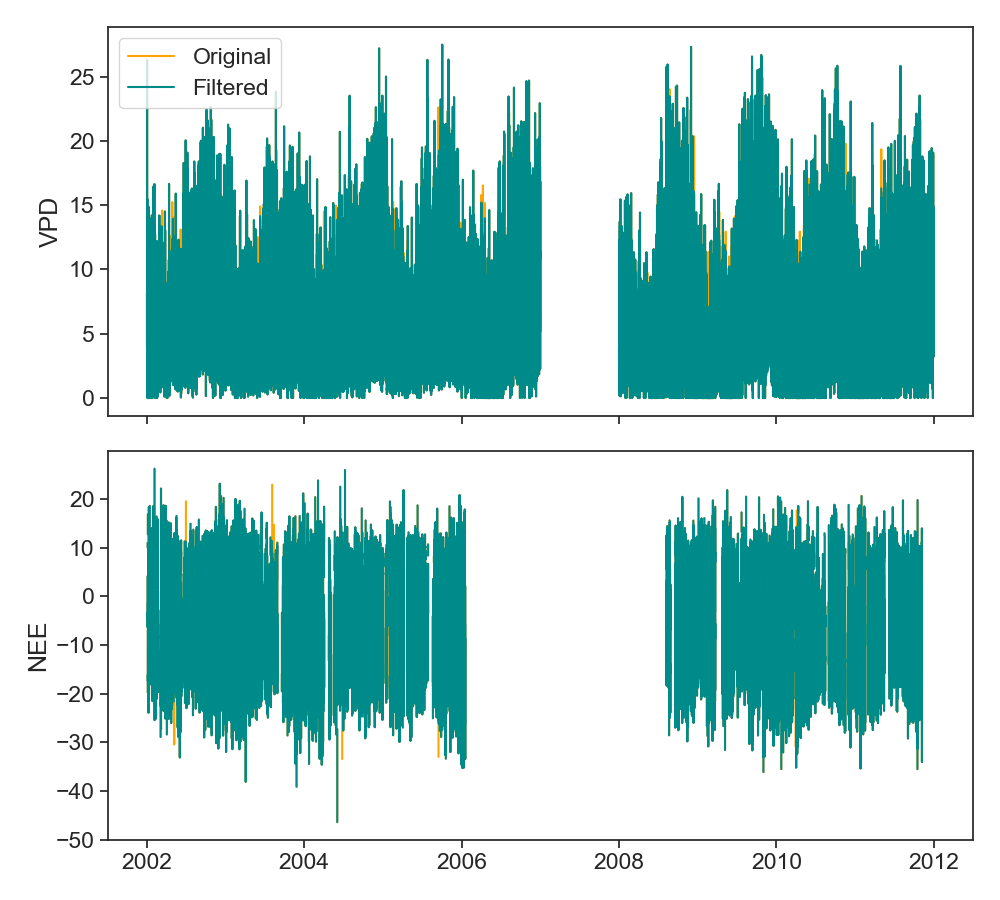

In [13]:
plot_all_columns2(filtered_df)

### Temperature

In [14]:
filtered_df1 = df['temperature'].to_frame() # make a copy of the dataframe

outliers1 = pd.DataFrame() # create a new dataframe

filtered_df1['temperature' + '_filtered'] = rolling_iqr_envelop(filtered_df1['temperature'], k=2)
outliers1['temperature'] = [filtered_df1['temperature' + '_filtered'].isna().sum() - filtered_df1['temperature'].isna().sum()] 

In [15]:
outliers1

,temperature
0,296


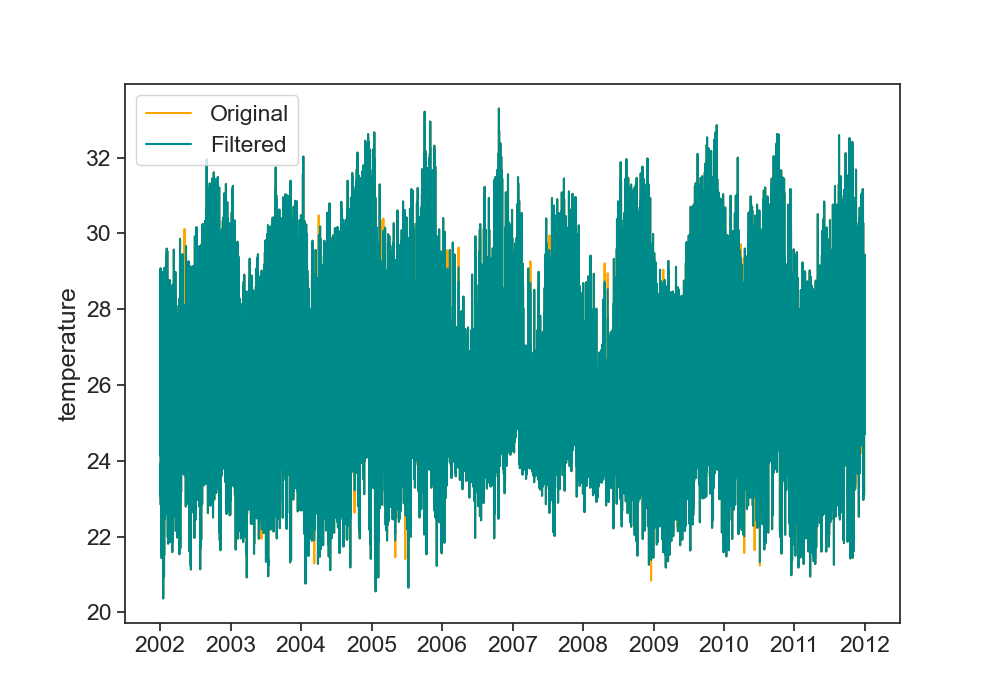

In [16]:
# plotting
plot_all_columns2(filtered_df1)

## Gap filling

I'll gap-fill the series with the RandomForest model and compare it to the FLUXNET gapfilled data.

In [17]:
# function for plotting original series along with interpolated/predicted seires
def plot_missing_vals(original, new, title=''):
    column_list = original.columns
    
    fig, ax = plt.subplots(len(column_list),1, sharex=True, figsize=(10,len(column_list)*2+5))

    if len(column_list) == 1:
        ax.set_title(title)
        ax.plot(new[column_list[0]], c='r', label='Gap-Filled')
        ax.plot(original[column_list[0]], label='Original')
        return
    for i, column in enumerate(column_list):
        ax[i].plot(new[column], c='r', label='Gap-Filled')
        ax[i].plot(original[column], c='tab:blue', label='Original')
        
        if i == 0:
            ax[i].set_title(title)

        ax[i].set(ylabel=column)
    
    locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
    formatter = mdates.ConciseDateFormatter(locator)
    ax[i].xaxis.set_major_locator(locator)
    ax[i].xaxis.set_major_formatter(formatter)

    ax[0].legend()
    plt.tight_layout()

    return

In [18]:
# Function for filling gaps with RandomForest model
def fillna_randomforest(series):
    # Ensure the series index is a datetime object
    if not isinstance(series.index, pd.DatetimeIndex):
        raise ValueError("Index must be a DatetimeIndex")
    
    # Split series into observed and missing values
    observed = series.dropna()
    missing = series[series.isna()]
    
    # If no observed values exist, return the series as is
    if observed.empty:
        print("No observed values available. Returning original series.")
        return series
    
    # If no missing values exist, return the series as is
    if missing.empty:
        print("No missing values to fill. Returning original series.")
        return series
    
    # Extracting time-based features
    def create_features(index):
        return np.array([[idx.hour, idx.day, idx.month, idx.year] for idx in index])
    
    # Create features for training data
    X_train = create_features(observed.index)
    y_train = observed.values
    
    # Train the Random Forest regression model
    model = RandomForestRegressor()
    model.fit(X_train, y_train)
    
    # Create features for missing data and predict
    X_missing = create_features(missing.index)
    predicted_values = model.predict(X_missing)
    
    # Assign the predicted values to the missing positions
    series_filled = series.copy()
    series_filled[series_filled.isna()] = predicted_values

    return series_filled


In [19]:
# Creating a new dataframes
RF_df = pd.DataFrame()
df3 = pd.DataFrame()

# insert relevant columns for each dataframe
RF_df['temperature'] = filtered_df1['temperature_filtered']
RF_df['VPD'] = filtered_df['VPD_filtered']
RF_df['precipitation'] = df1['precipitation']
RF_df['NEE'] = filtered_df['NEE_filtered']

df3['temperature'] = df1['temperature']
df3['VPD'] = only_measured['VPD']
df3['precipitation'] = df1['precipitation']
df3['NEE'] = only_measured['NEE']


In [20]:
columns = RF_df.columns

# apply the RandomForest function on all columns of the dataframe
for i, column in enumerate(columns):
    RF_df[column] = fillna_randomforest(RF_df[column]) 

No missing values to fill. Returning original series.


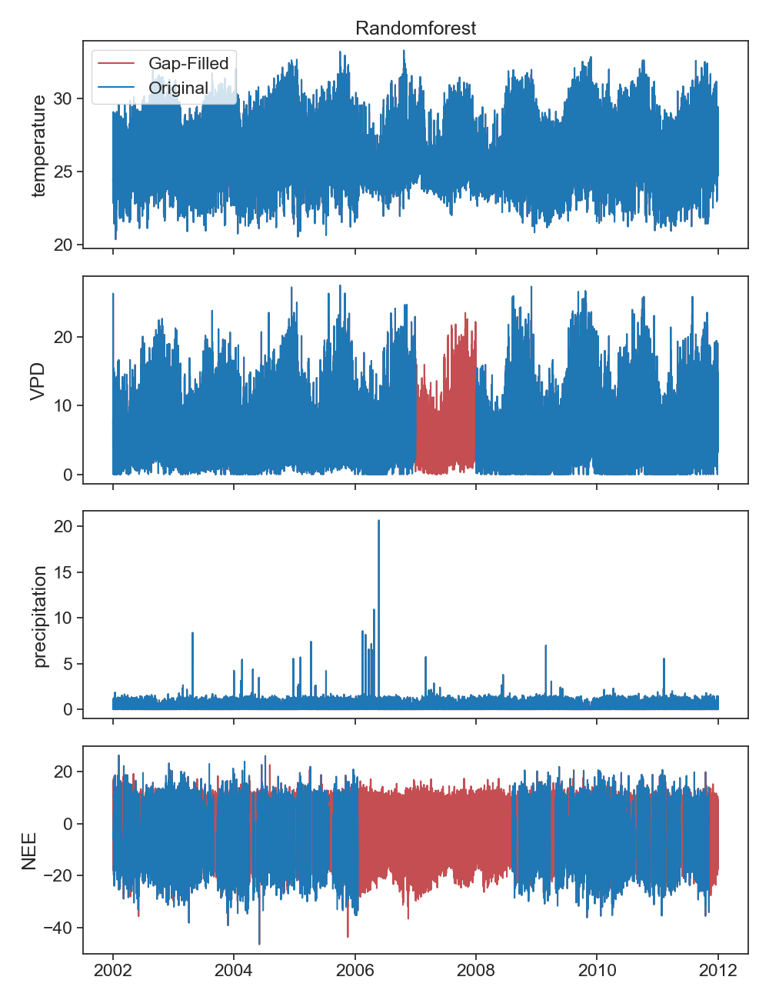

In [21]:
plot_missing_vals(df3, RF_df, title='Randomforest')

### Comparing gap-filling methods

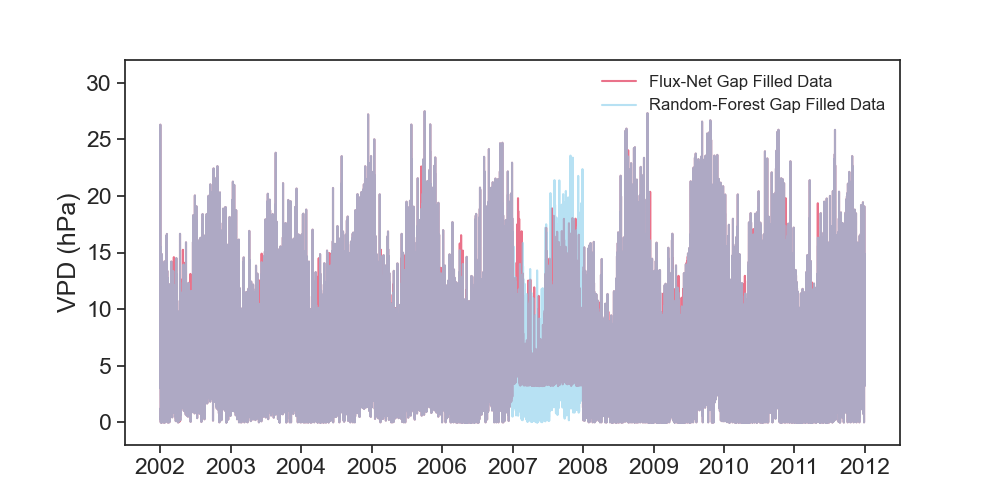

In [141]:
# create a figure
fig, ax = plt.subplots(figsize=(10,5))
# plot the data
ax.plot(df1['VPD'], color='#DC143C', label='Flux-Net Gap Filled Data', alpha=0.6)
ax.plot(RF_df['VPD'], color='#87CEEB', label='Random-Forest Gap Filled Data', alpha=0.6)
ax.set(ylabel='VPD (hPa)', ylim=(-2,32))

ax.legend(fontsize=12, frameon=False); # legend

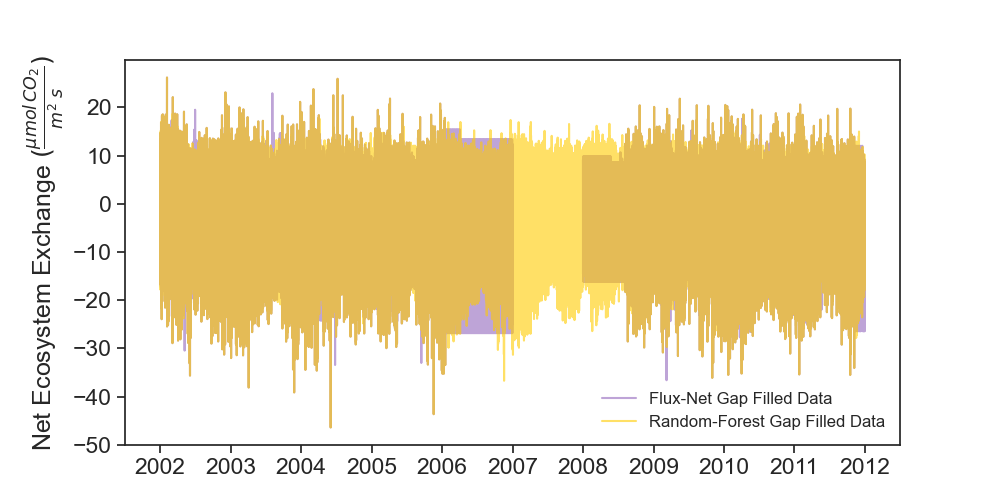

In [142]:
# create a figure
fig, ax = plt.subplots(figsize=(10,5))
# plot the data
ax.plot(df1['NEE'], color='#9467bd', label='Flux-Net Gap Filled Data', alpha=0.6)
ax.plot(RF_df['NEE'], color='#ffcc00', label='Random-Forest Gap Filled Data', alpha=0.6)
ax.set(ylabel=r'Net Ecosystem Exchange $(\frac{\mu mol\,CO_2}{m^2\; s})$')

ax.legend(fontsize=12, frameon=False); # legend

## Resampling

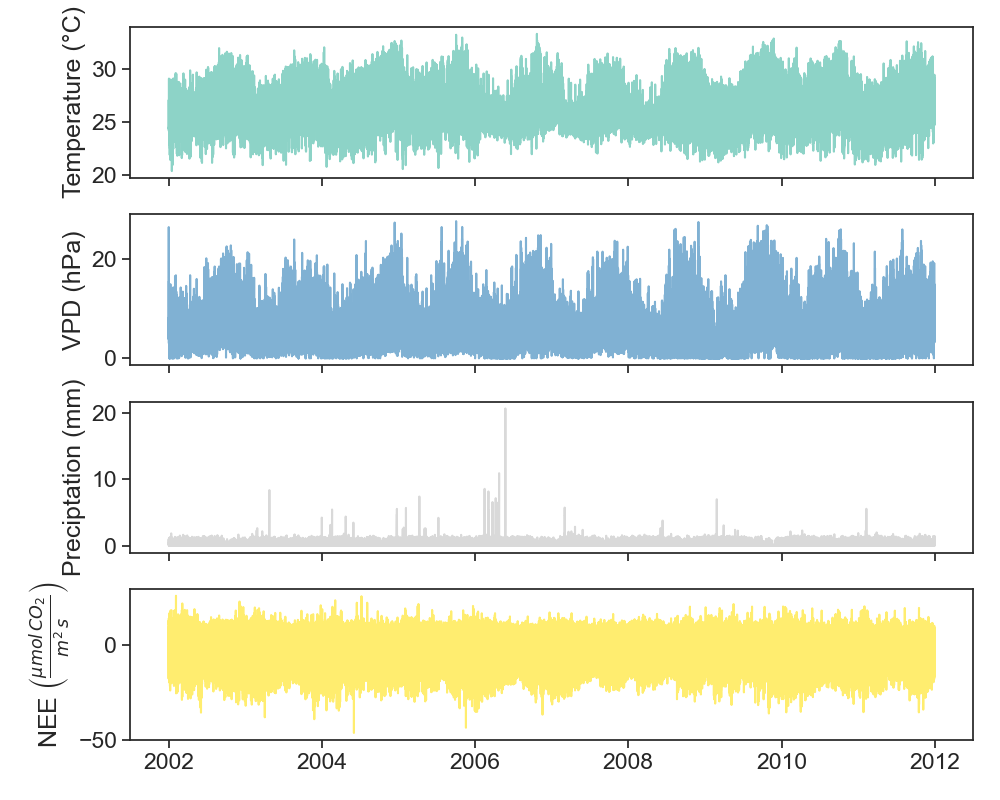

In [256]:
# plotting
plot_all_columns(RF_df)

I'll resample to monthly average for clearer point of view

In [143]:
df_month = (RF_df.resample('ME')        # resample by month
                             .mean()                # take the mean
           )
df_month

,temperature,VPD,precipitation,NEE
date,,,,
2002-01-31,24.983579,4.707087,0.373802,1.667933
2002-02-28,25.051107,4.137467,0.441174,1.089428
2002-03-31,24.750642,3.748160,0.378206,1.308325
2002-04-30,24.936365,3.718067,0.368671,0.777426
2002-05-31,25.629180,4.136669,0.331879,1.154033
...,...,...,...,...
2011-08-31,26.801369,7.054126,0.224198,-0.250967
2011-09-30,27.109418,7.588181,0.163083,-1.421778
2011-10-31,26.731773,7.976304,0.283105,-1.429407


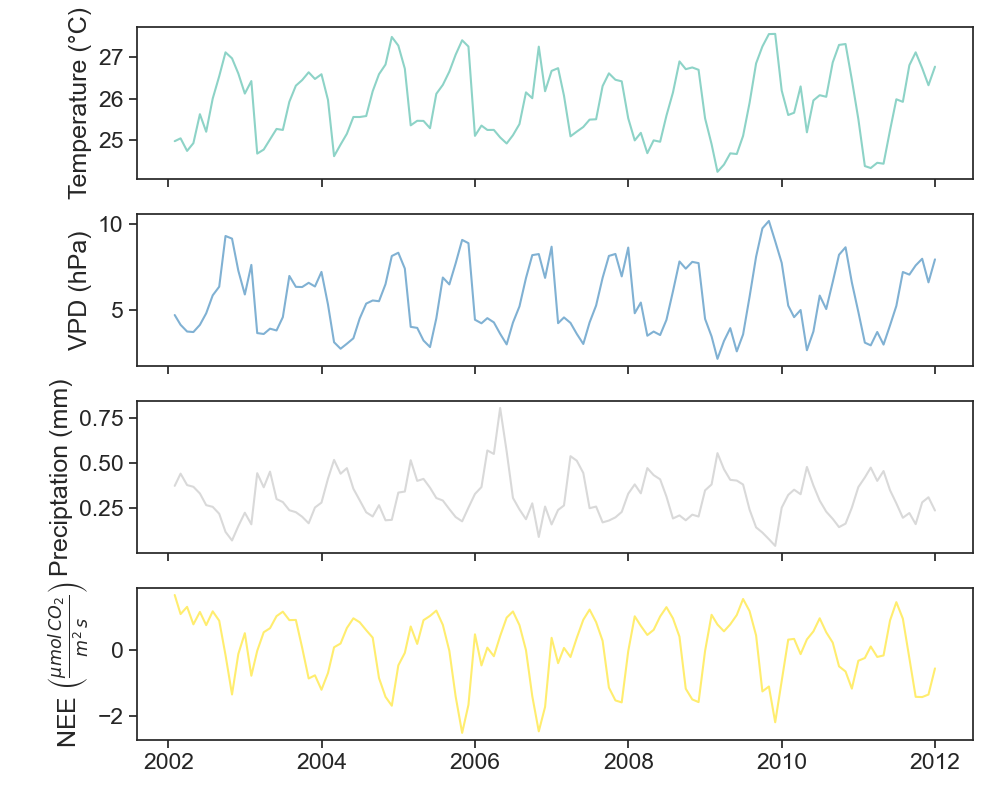

In [257]:
# plotting
plot_all_columns(df_month)

## Seasonal Decomposition

### Classic

Seasonal decomposition with the classic additive model

In [39]:
df_season = RF_df.copy() # make a copy of the dataframe
season_columns  = df_season.columns
# Compute the trend for each variable:
for column in season_columns:
    df_season[column + '_trend'] = df_season[column].rolling('365D', center=True).mean()


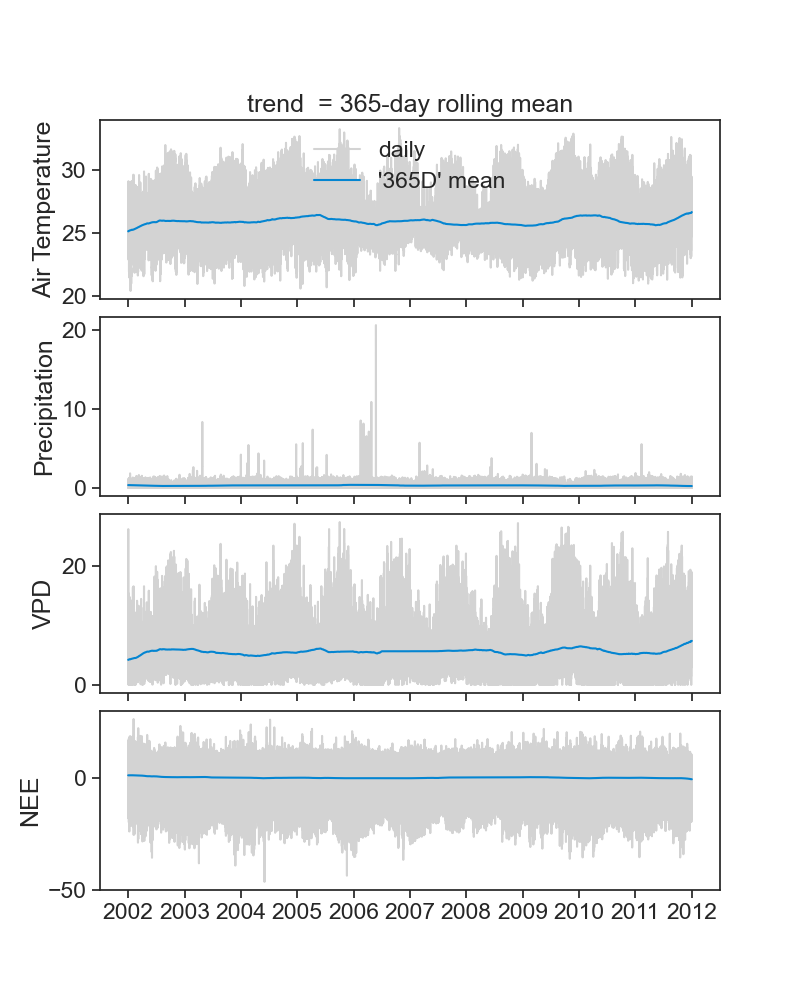

In [40]:
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)
fig.subplots_adjust(hspace=0.1)  # increase vertical space between panels
# plot original series and the trend for each variable
ax[0].plot(df_season['temperature'], color="lightgray", label="daily")
ax[0].plot(df_season['temperature_trend'], color="xkcd:cerulean", label="'365D' mean")
ax[0].set(ylabel='Air Temperature')

ax[1].plot(df_season['precipitation'], color="lightgray", label="daily")
ax[1].plot(df_season['precipitation_trend'], color="xkcd:cerulean", label="'365D' mean")
ax[1].set(ylabel='Precipitation')

ax[2].plot(df_season['VPD'], color="lightgray")
ax[2].plot(df_season['VPD_trend'], color="xkcd:cerulean")
ax[2].set(ylabel='VPD')

ax[3].plot(df_season['NEE'], color="lightgray")
ax[3].plot(df_season['NEE_trend'], color="xkcd:cerulean")
ax[3].set(ylabel='NEE')

ax[0].set(title="trend  = 365-day rolling mean")

ax[0].legend(frameon=False)
pass

In [41]:
# Comupte the detrended series for each variable:
for column in season_columns:
    df_season[column + '_detrended'] = df_season[column] - df_season[column + '_trend']


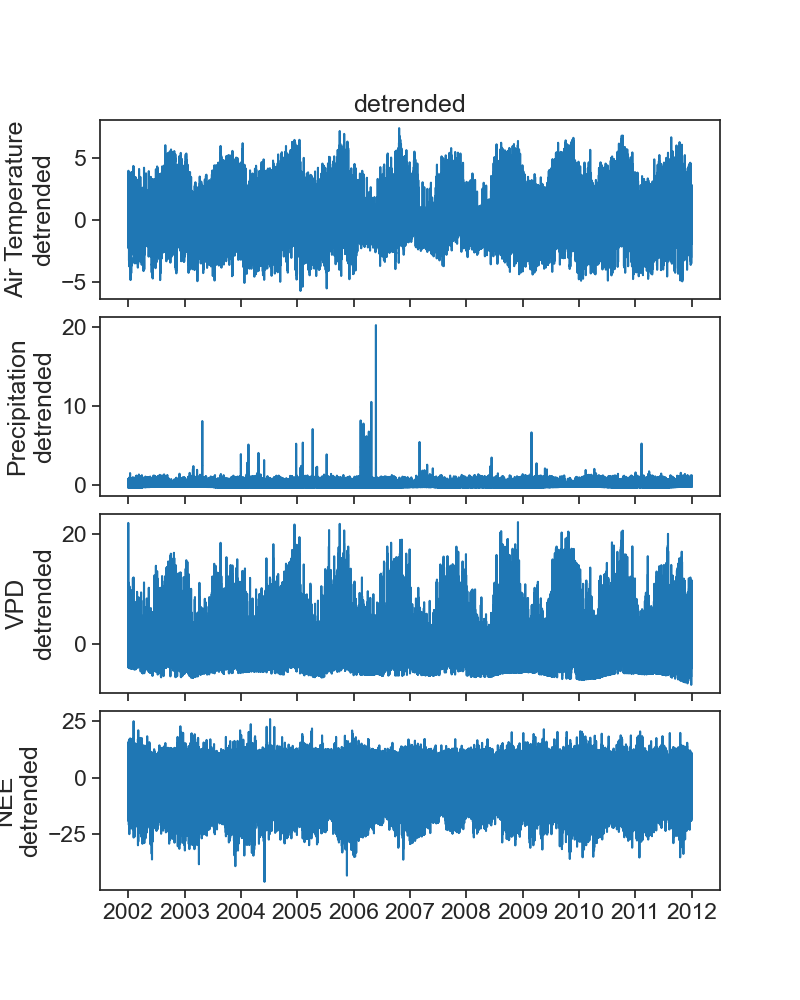

In [42]:
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)
fig.subplots_adjust(hspace=0.1)  # increase vertical space between panels

# Plot detrended series for each variable
ax[0].plot(df_season['temperature_detrended'], color="tab:blue")
ax[0].set(ylabel='Air Temperature\ndetrended')

ax[1].plot(df_season['precipitation_detrended'], color="tab:blue")
ax[1].set(ylabel='Precipitation\ndetrended')

ax[2].plot(df_season['VPD_detrended'], color="tab:blue")
ax[2].set(ylabel='VPD\ndetrended')

ax[3].plot(df_season['NEE_detrended'], color="tab:blue")
ax[3].set(ylabel='NEE\ndetrended')

ax[0].set(title="detrended")

pass

In [43]:
df_season['doy'] = df_season.index.day_of_year # add day of the year column
df_season['year'] = df_season.index.year # add year column
df_season

,temperature,VPD,precipitation,NEE,temperature_trend,VPD_trend,precipitation_trend,NEE_trend,temperature_detrended,VPD_detrended,precipitation_detrended,NEE_detrended,doy,year
date,,,,,,,,,,,,,,
2002-01-01 00:00:00,24.478,8.1500,0.153,10.93085,25.105702,4.237440,0.358134,1.102243,-0.627702,3.912560,-0.205134,9.828607,1,2002
2002-01-01 01:00:00,24.442,7.2700,0.153,10.92280,25.106593,4.239330,0.358229,1.100382,-0.664593,3.030670,-0.205229,9.822418,1,2002
2002-01-01 02:00:00,24.400,7.6100,0.592,13.89762,25.107009,4.239533,0.358296,1.097632,-0.707009,3.370467,0.233704,12.799988,1,2002
2002-01-01 03:00:00,24.358,5.7600,0.592,15.28855,25.107635,4.239967,0.358362,1.095801,-0.749635,1.520033,0.233638,14.192749,1,2002
2002-01-01 04:00:00,24.318,5.1100,0.592,11.20196,25.108345,4.240966,0.358429,1.095555,-0.790345,0.869034,0.233571,10.106405,1,2002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-31 19:00:00,25.243,6.3807,0.005,9.07443,26.620119,7.428757,0.236758,-0.669426,-1.377119,-1.048057,-0.231758,9.743856,365,2011
2011-12-31 20:00:00,25.239,5.8729,0.695,8.95537,26.620986,7.430413,0.236631,-0.668462,-1.381986,-1.557513,0.458369,9.623832,365,2011
2011-12-31 21:00:00,25.239,4.9595,0.695,8.36960,26.621685,7.431835,0.236505,-0.667303,-1.382685,-2.472335,0.458495,9.036903,365,2011


In [44]:
gb_year = df_season.groupby('year') # group the dataframe by year

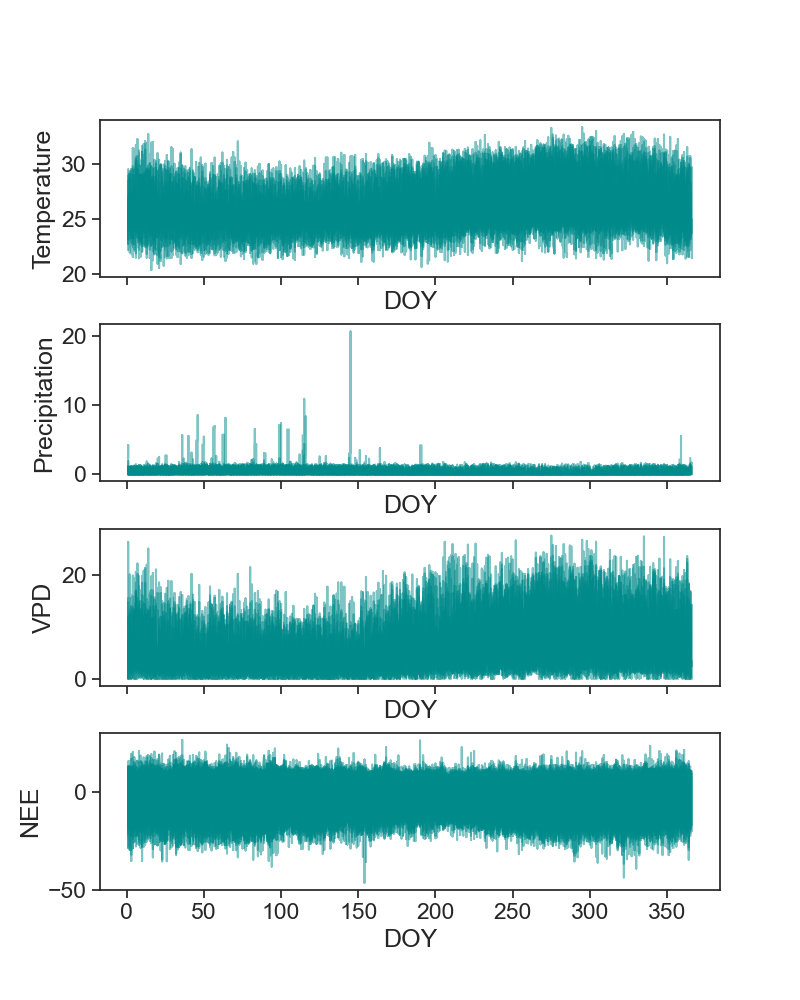

In [45]:
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)
fig.subplots_adjust(hspace=0.3)  # increase vertical space between panels

# plot yearly serieses for each variable
for year, data in gb_year:
    ax[0].plot(data['doy'], data['temperature'], color="darkcyan", alpha=0.5)
ax[0].set(xlabel="DOY", ylabel="Temperature");

for year, data in gb_year:
    ax[1].plot(data['doy'], data['precipitation'], color="darkcyan", alpha=0.5)
ax[1].set(xlabel="DOY", ylabel="Precipitation");

for year, data in gb_year:
    ax[2].plot(data['doy'], data['VPD'], color="darkcyan", alpha=0.5)
ax[2].set(xlabel="DOY", ylabel="VPD");

for year, data in gb_year:
    ax[3].plot(data['doy'], data['NEE'], color="darkcyan", alpha=0.5)
ax[3].set(xlabel="DOY", ylabel="NEE");

In [46]:
# Compute average for each DOY
avg_temp = df_season.groupby('doy')['temperature_detrended'].mean()
avg_rain = df_season.groupby('doy')['precipitation_detrended'].mean()
avg_vpd = df_season.groupby('doy')['VPD_detrended'].mean()
avg_NEE = df_season.groupby('doy')['NEE_detrended'].mean()

In [47]:
# Compute Seasonal component for each variable:
df_season['temperature_seasonal'] = df_season['doy'].map(avg_temp)
df_season['precipitation_seasonal'] = df_season['doy'].map(avg_rain)
df_season['VPD_seasonal'] = df_season['doy'].map(avg_vpd)
df_season['NEE_seasonal'] = df_season['doy'].map(avg_NEE)

[Text(0, 0.5, 'Seasonal NEE\n component')]

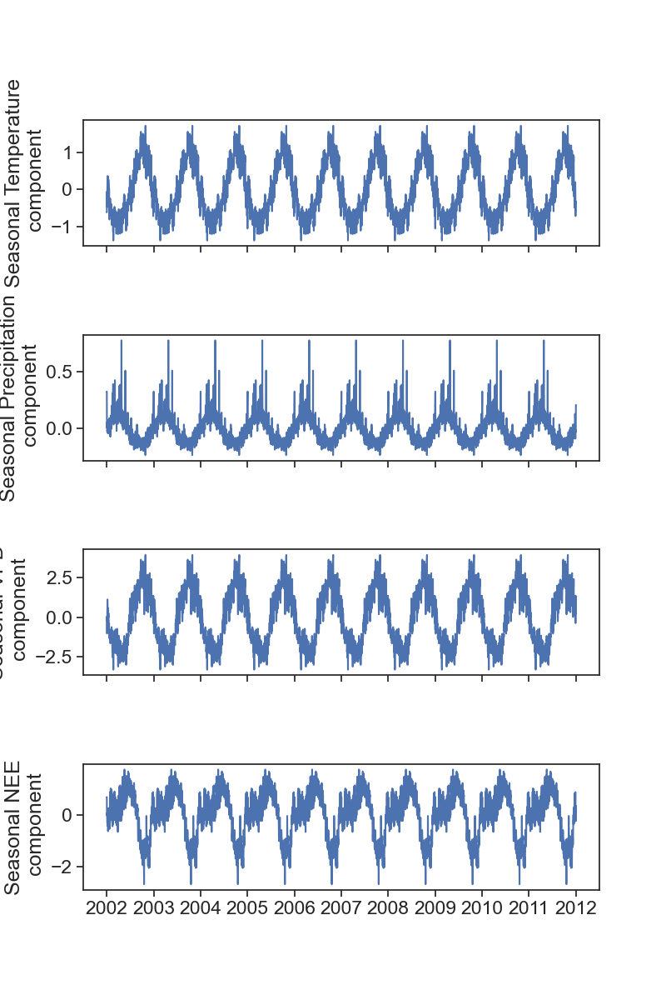

In [48]:
fig, ax = plt.subplots(4, 1, figsize=(8, 12), sharex=True)
fig.subplots_adjust(hspace=0.7)

#plot seasonal componenet for each variable
ax[0].plot(df_season['temperature_seasonal'])
ax[0].set(ylabel='Seasonal Temperature\n component')

ax[1].plot(df_season['precipitation_seasonal'])
ax[1].set(ylabel='Seasonal Precipitation\n component')

ax[2].plot(df_season['VPD_seasonal'])
ax[2].set(ylabel='Seasonal VPD\n component')

ax[3].plot(df_season['NEE_seasonal'])
ax[3].set(ylabel='Seasonal NEE\n component')

In [49]:
# Compute residual component for each variable:
for column in season_columns:
    df_season[column + '_resid'] = df_season[column + '_detrended'] - df_season[column + '_seasonal']


[Text(0, 0.5, 'Residual NEE\n component')]

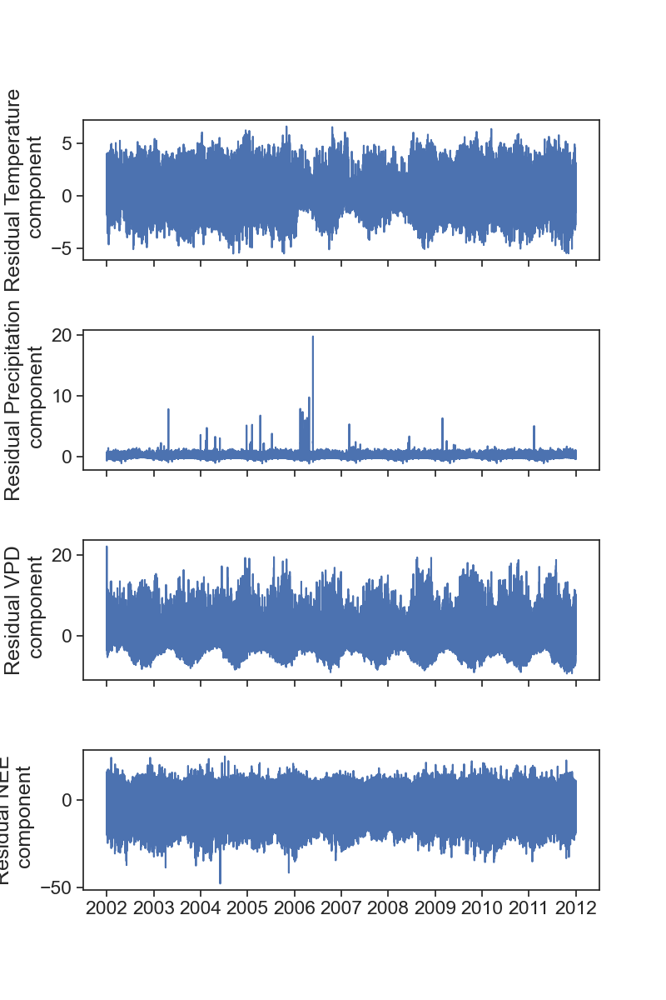

In [50]:
fig, ax = plt.subplots(4, 1, figsize=(8, 12), sharex=True)
fig.subplots_adjust(hspace=0.5)

# plot residual component for each variable
ax[0].plot(df_season['temperature_resid'])
ax[0].set(ylabel='Residual Temperature\n component')

ax[1].plot(df_season['precipitation_resid'])
ax[1].set(ylabel='Residual Precipitation\n component')

ax[2].plot(df_season['VPD_resid'])
ax[2].set(ylabel='Residual VPD\n component')

ax[3].plot(df_season['NEE_resid'])
ax[3].set(ylabel='Residual NEE\n component')

In [51]:
# calculate ADF test results for the residual component for each variable
result1 = adfuller(df_season['temperature_resid'].dropna())
print('Temperature residual\nADF test p-value: ', result1[1])

result2 = adfuller(df_season['precipitation_resid'].dropna())
print('Precipitation residual\nADF test p-value: ', result2[1])

result3 = adfuller(df_season['VPD_resid'].dropna())
print('VPD residual\nADF test p-value: ', result3[1])

result4 = adfuller(df_season['NEE_resid'].dropna())
print('NEE residual\nADF test p-value: ', result4[1])


Temperature residual
ADF test p-value:  0.0
Precipitation residual
ADF test p-value:  0.0
VPD residual
ADF test p-value:  0.0
NEE residual
ADF test p-value:  0.0


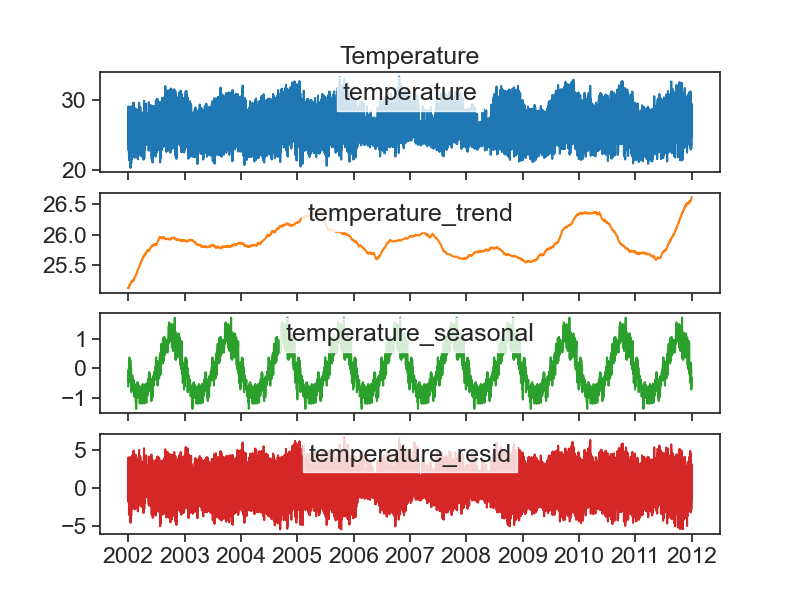

In [52]:
fig, ax = plt.subplots(4, 1, figsize=(8,6), sharex=True)
pos = (0.5, 0.9)
components =["temperature", "temperature_trend", "temperature_seasonal", "temperature_resid"]
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
for axx, component, color in zip(ax, components, colors):
    data = getattr(df_season, component)
    axx.plot(data, color=color)
    axx.text(*pos, component, bbox=dict(facecolor='white', alpha=0.8),
           transform=axx.transAxes, ha='center', va='top')
ax[0].set(title="Temperature");

C:\Users\nissan-lab\AppData\Local\Temp\ipykernel_22360\835278270.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)


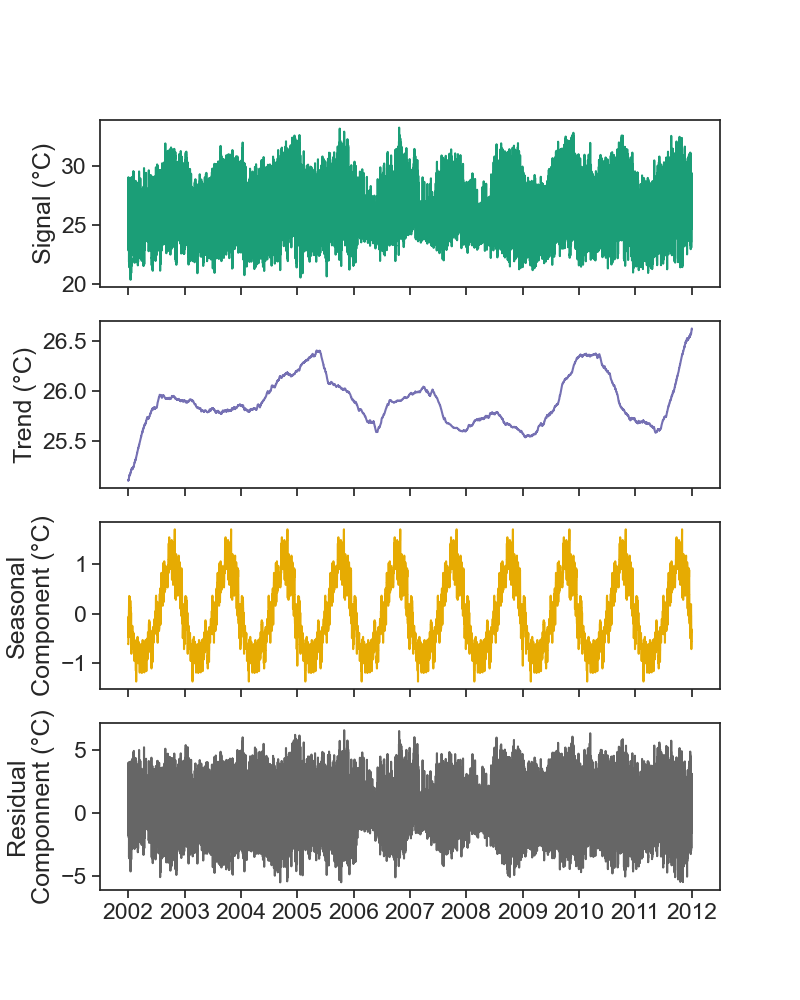

In [53]:
# Make another nicer plot of the temperture for the report
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)

components =["temperature", "temperature_trend", "temperature_seasonal", "temperature_resid"]
labels = ['Signal (°C)', 'Trend (°C)', 'Seasonal\nComponent (°C)', 'Residual\nComponnent (°C)']

# Generate distinct colors
colors = plt.cm.Dark2(np.linspace(0, 1, len(labels)))
for i, (component, color) in enumerate(zip(components, colors)) :
    data = getattr(df_season, component)
    ax[i].plot(data, color=color)
    ax[i].set_ylabel(labels[i])

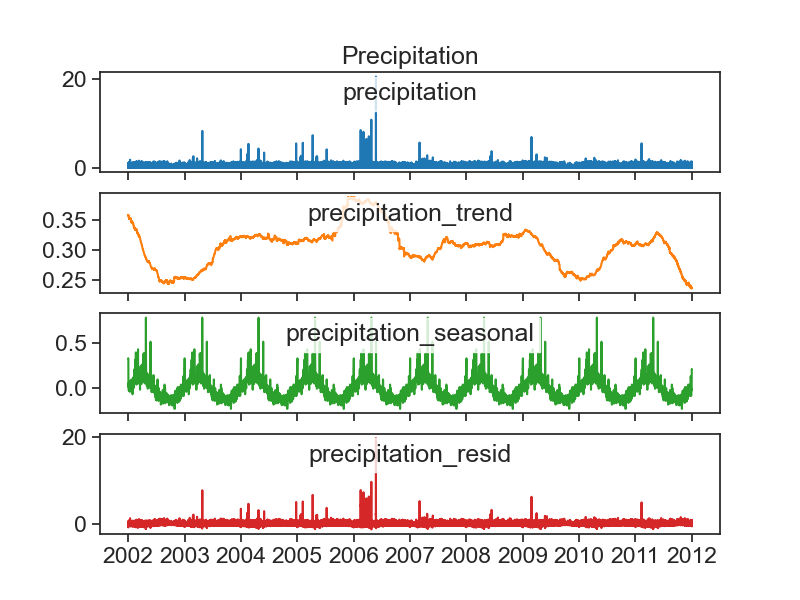

In [54]:
fig, ax = plt.subplots(4, 1, figsize=(8,6), sharex=True)
pos = (0.5, 0.9)
components =["precipitation", "precipitation_trend", "precipitation_seasonal", "precipitation_resid"]
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
for axx, component, color in zip(ax, components, colors):
    data = getattr(df_season, component)
    axx.plot(data, color=color)
    axx.text(*pos, component, bbox=dict(facecolor='white', alpha=0.8),
           transform=axx.transAxes, ha='center', va='top')
ax[0].set(title="Precipitation");

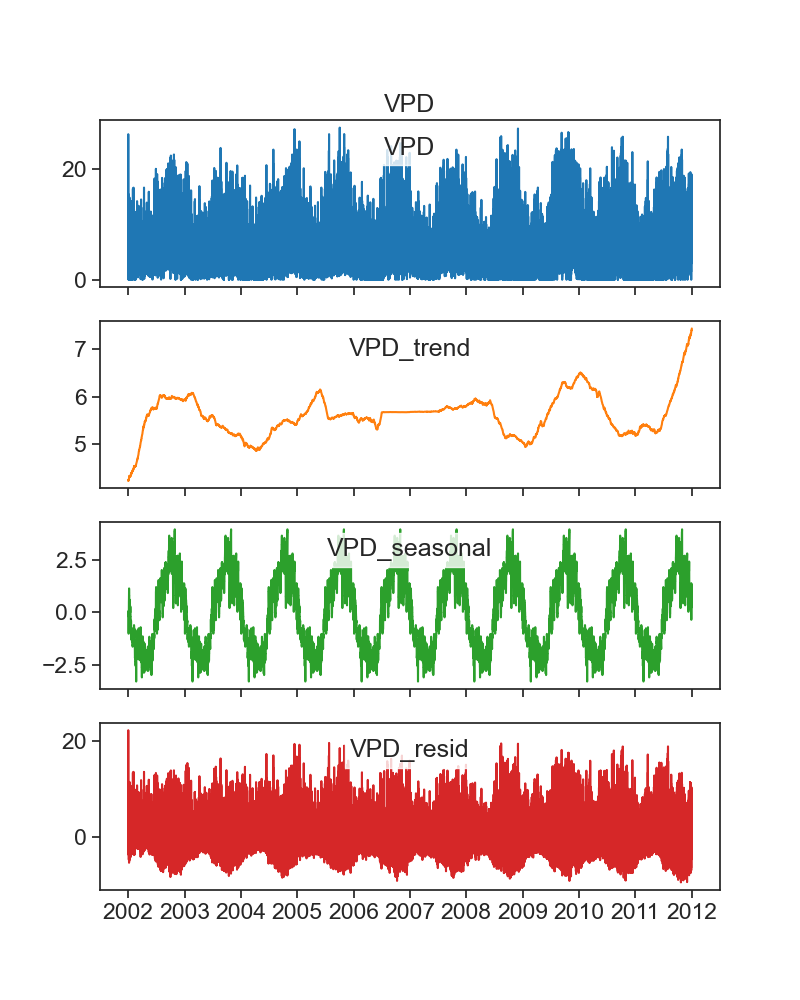

In [55]:
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)
pos = (0.5, 0.9)
components =["VPD", "VPD_trend", "VPD_seasonal", "VPD_resid"]
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
for axx, component, color in zip(ax, components, colors):
    data = getattr(df_season, component)
    axx.plot(data, color=color)
    axx.text(*pos, component, bbox=dict(facecolor='white', alpha=0.8),
           transform=axx.transAxes, ha='center', va='top')
ax[0].set(title="VPD");

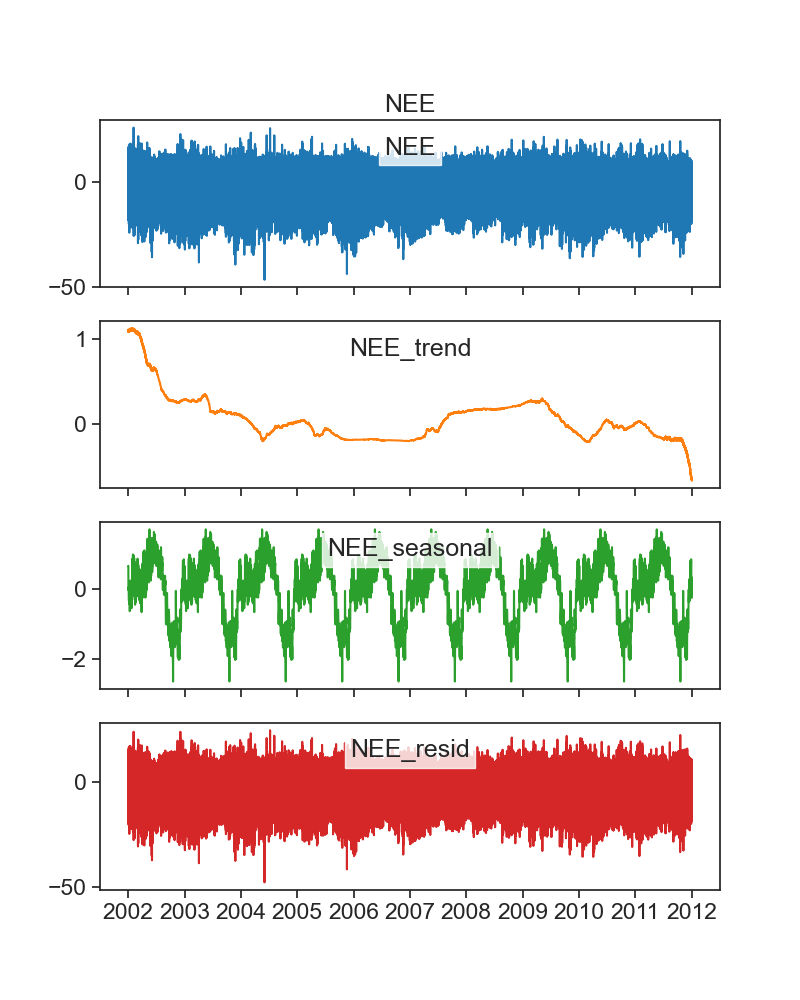

In [56]:
fig, ax = plt.subplots(4, 1, figsize=(8,10), sharex=True)
pos = (0.5, 0.9)
components =["NEE", "NEE_trend", "NEE_seasonal", "NEE_resid"]
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
for axx, component, color in zip(ax, components, colors):
    data = getattr(df_season, component)
    axx.plot(data, color=color)
    axx.text(*pos, component, bbox=dict(facecolor='white', alpha=0.8),
           transform=axx.transAxes, ha='center', va='top')
ax[0].set(title="NEE");

### FFT

#### Frequencies

In [57]:
# Function for getting the FFT frequencies for a series
def fft_freq(data):
    dt = 1 # 1hr interval 
    N = len(data)
    t = np.arange(0, N, dt)
    x = data.values
    # standardize x:
    x = (x - np.mean(x))/np.std(x)

    fft = scipy.fft.fft(x) / N
    k = scipy.fft.fftfreq(N, dt)
    fft_abs = np.abs(fft)

    fft_abs = fft_abs[k>=0]
    k = k[k>=0]

    peaks, _ = find_peaks(fft_abs, threshold=0.05)

    return fft_abs, k, peaks, x

##### Temperature

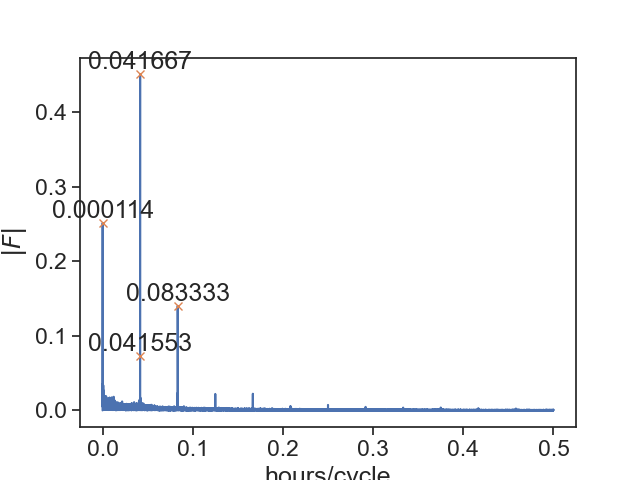

In [58]:
# Plot FFT Power spectrum vs. frequencies
fft_abs1, k1, peaks1, x1 = fft_freq(RF_df['temperature'])

np.seterr(divide='ignore')

fig, ax = plt.subplots()
ax.plot(k1, fft_abs1)
ax.set(xlabel="hours/cycle",
       ylabel=r"$|F|$")
ax.plot(k1[peaks1], fft_abs1[peaks1], "x")

for peak in peaks1:
    ax.text(k1[peak], fft_abs1[peak], f'{k1[peak]:.6f}', ha='center', va='bottom')
None


##### VPD

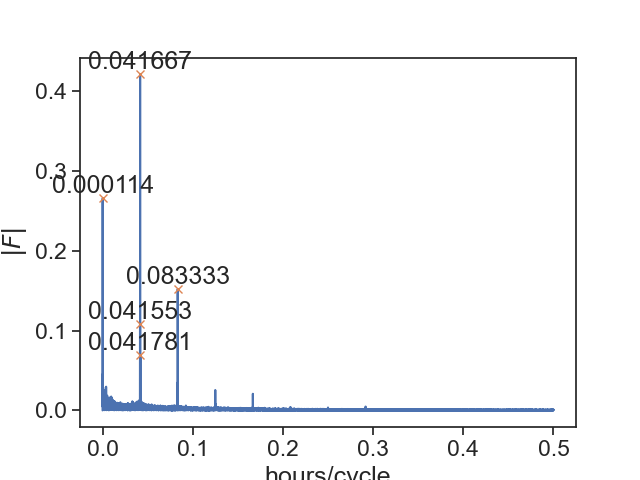

In [59]:
# Plot FFT Power spectrum vs. frequencies
fft_abs2, k2, peaks2, x2 = fft_freq(RF_df['VPD'])

np.seterr(divide='ignore')

fig, ax = plt.subplots()
ax.plot(k2, fft_abs2)
ax.set(xlabel="hours/cycle",
       ylabel=r"$|F|$")
ax.plot(k2[peaks2], fft_abs2[peaks2], "x")
# ax.set_xscale('log')
# ax.set_xlim(-50,450)
for peak in peaks2:
    ax.text(k2[peak], fft_abs2[peak], f'{k2[peak]:.6f}', ha='center', va='bottom')
None
# print(1/k[peaks])

##### NEE

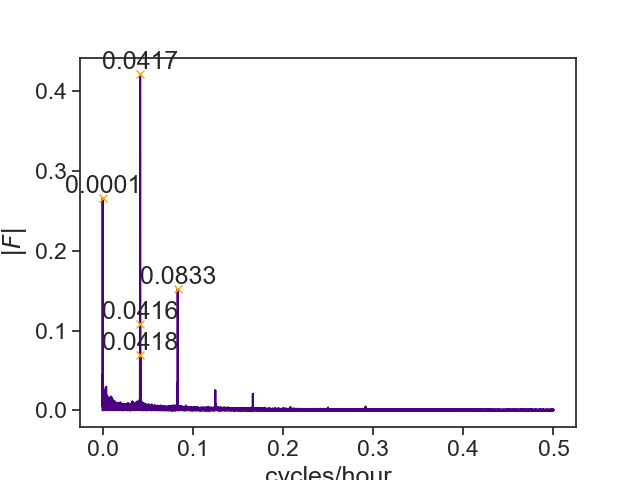

In [60]:
# Plot FFT Power spectrum vs. frequencies
fft_abs3, k3, peaks3, x3 = fft_freq(RF_df['VPD'])

np.seterr(divide='ignore')

fig, ax = plt.subplots()
ax.plot(k3, fft_abs3, color='indigo')
ax.set(xlabel="cycles/hour",
       ylabel=r"$|F|$")
ax.plot(k3[peaks3], fft_abs3[peaks3], "x", color='orange')
# ax.set_xscale('log')
# ax.set_xlim(-50,450)
for peak in peaks3:
    ax.text(k3[peak], fft_abs3[peak], f'{k3[peak]:.4f}', ha='center', va='bottom')
None
# print(1/k[peaks])

#### Seasonal decomposition

In [61]:
def fft_filter(array, condition):
    # this function recieves 2 arguments:
    #  array - np array of the timeseries that needs filtering
    # condition - np array of a mask of boolean values 
    # true values will be kept and false values will be set to 0
    
    # FFT the signal
    sig_fft = scipy.fft.fft(array)

    # copy the FFT results
    sig_fft_filtered = sig_fft.copy()
    sig_fft_filtered[~condition] = 0

    # get the filtered signal in time domain
    filtered = scipy.fft.ifft(sig_fft_filtered) 
    return filtered

An example for the lowpass filtering for getting the seasonal component

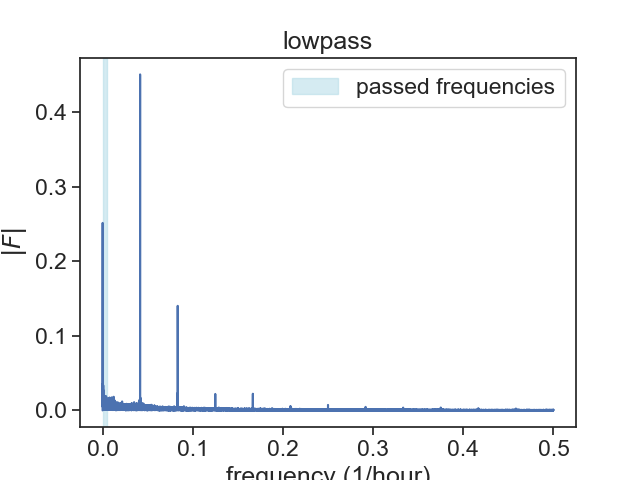

In [62]:
cut_off = 0.005

fig, ax = plt.subplots()
ax.plot(k1, fft_abs1)
ax.set(xlabel="frequency (1/hour)",
       ylabel=r"$|F|$",
       title=r"lowpass")


ax.axvspan(0, cut_off, color='lightblue', alpha=0.5, label='passed frequencies')
ax.legend()

In [63]:
# Frequencies for FFT filtering
freq = scipy.fft.fftfreq(len(RF_df), 1)

# Define condition for filtering
condition = np.abs(freq) < cut_off

##### Temperature

c:\Users\nissan-lab\anaconda3\Lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\nissan-lab\anaconda3\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


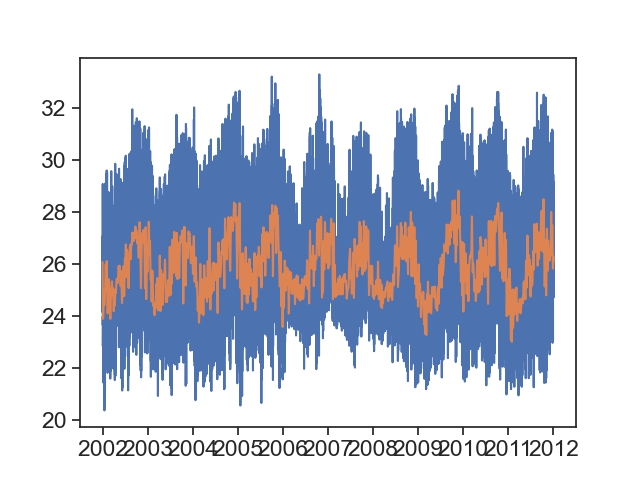

In [64]:
# Plot seasonal component and orignal series
fig, ax = plt.subplots()
ax.plot(RF_df['temperature'])
ax.plot(RF_df.index, fft_filter(RF_df['temperature'].values, condition))

##### VPD

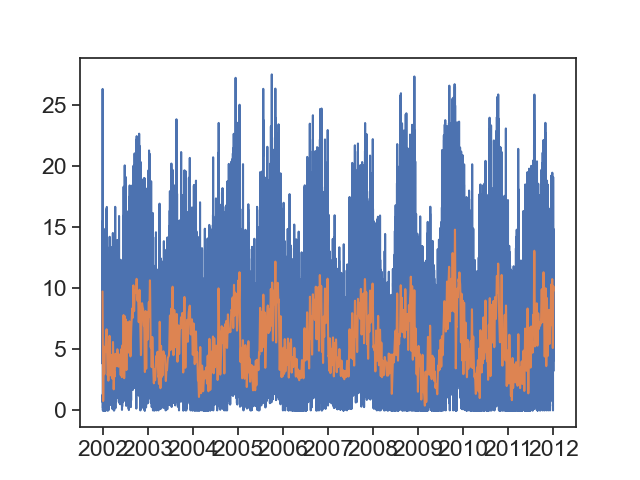

In [65]:
# Plot seasonal component and orignal series
fig, ax = plt.subplots()
ax.plot(RF_df['VPD'])
ax.plot(RF_df.index, fft_filter(RF_df['VPD'].values, condition))

##### NEE

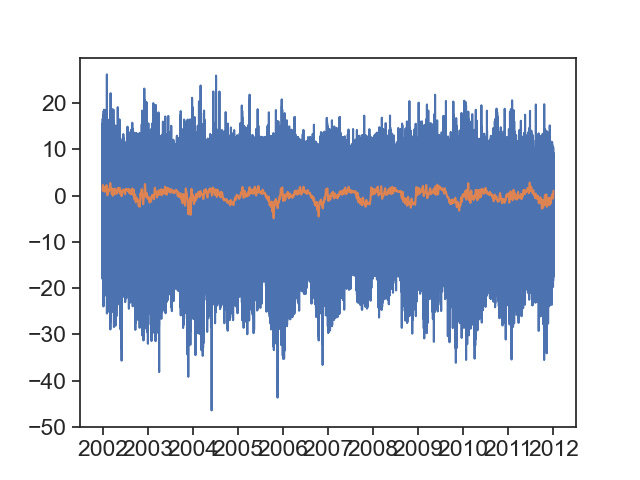

In [66]:
# Plot seasonal component and orignal series
fig, ax = plt.subplots()
ax.plot(RF_df['NEE'])
ax.plot(RF_df.index, fft_filter(RF_df['NEE'].values, condition))

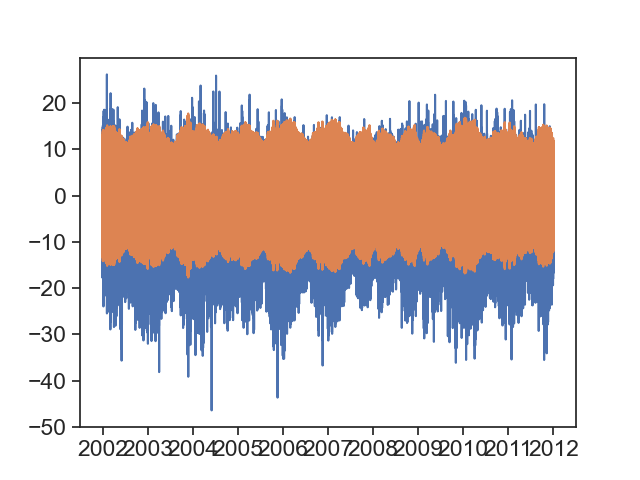

In [174]:
# Plot daily component for NEE 
fig, ax = plt.subplots()
ax.plot(RF_df['NEE'])
condition2 = (np.abs(freq) > 0.04) & (np.abs(freq) < 0.05)
ax.plot(RF_df.index, fft_filter(RF_df['NEE'].values, condition2))

### Comparing Seasonal components methods

Comparing the classic additive model to the FFT season decomposition

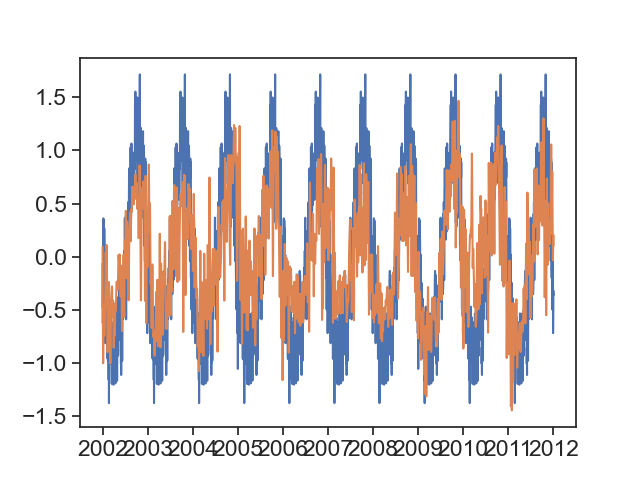

In [67]:
fig, ax = plt.subplots()
ax.plot(df_season['temperature_seasonal'])
ax.plot(df_season.index, fft_filter(x1, condition))

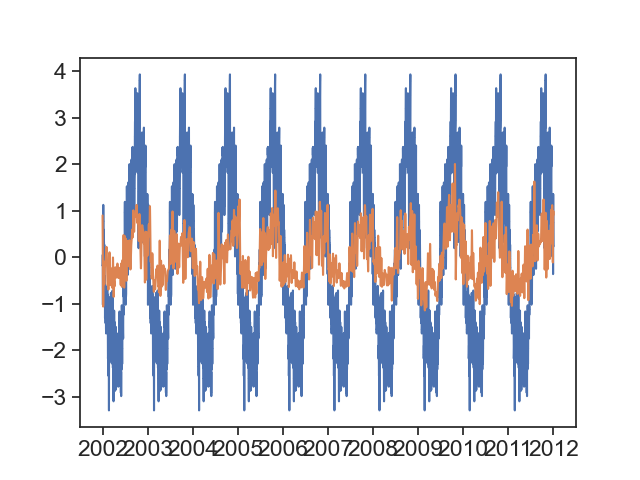

In [68]:
fig, ax = plt.subplots()
ax.plot(df_season['VPD_seasonal'])
ax.plot(df_season.index, fft_filter(x2, condition))

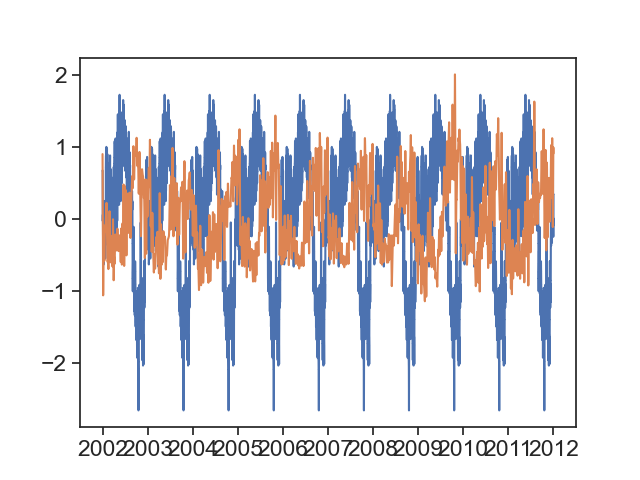

In [69]:
fig, ax = plt.subplots()
ax.plot(df_season['NEE_seasonal'])
ax.plot(df_season.index, fft_filter(x3, condition))

## Smoothing

In [70]:
# Smoothed the data with a rolling average with gaussian kernel
smoothed_df = (RF_df.rolling(window=30*24,
                          center=True,
                          win_type="gaussian")
                 .mean(std=24))

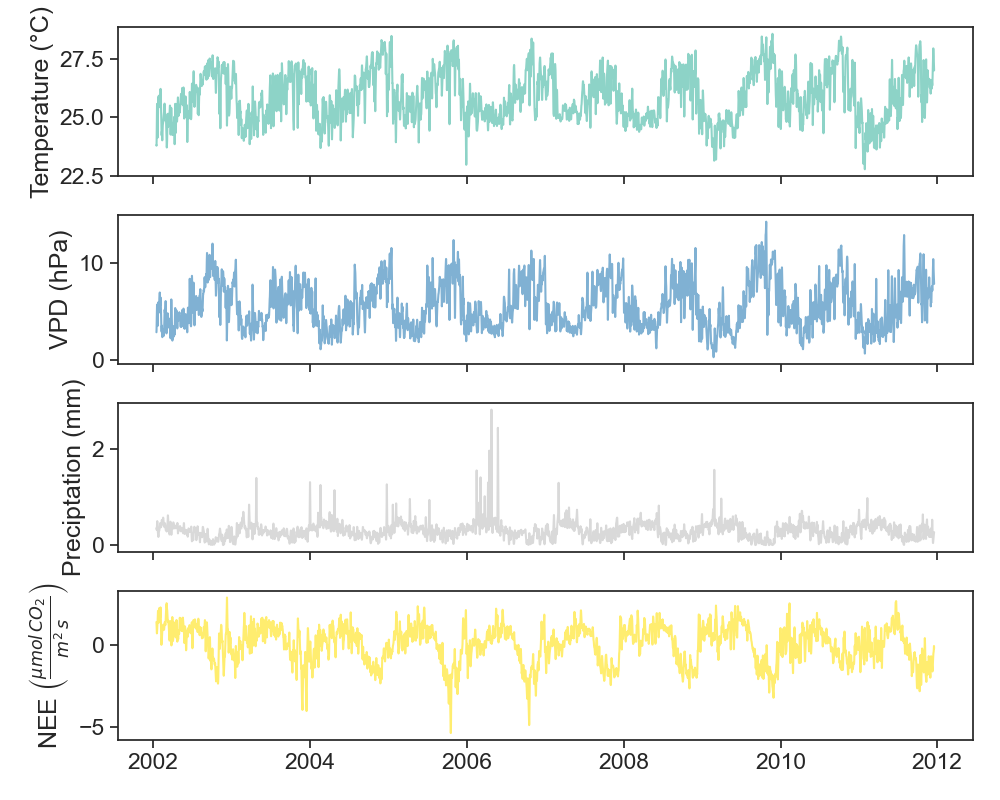

In [71]:
plot_all_columns(smoothed_df)

In [72]:
smoothed_df1 = RF_df.copy()
deriv_df = RF_df.copy()
grad_df = RF_df.copy()

# smoothing with Savitzky-Golay method:
for column in RF_df.columns:
    smoothed_df1[column] = scipy.signal.savgol_filter(RF_df[column].values,
                                            window_length=24*30,
                                            polyorder=3)
# get gradient with Savitzky-Golay     
for column in RF_df.columns:
    deriv_df[column] = scipy.signal.savgol_filter(RF_df[column].values,
                                            window_length=24*30,
                                            polyorder=3,
                                            deriv=1)
# get gradient with np.gradient from the yearly rolling average     
for column in RF_df.columns:
    grad_df[column] = np.gradient(df_season[column + '_trend'].values)

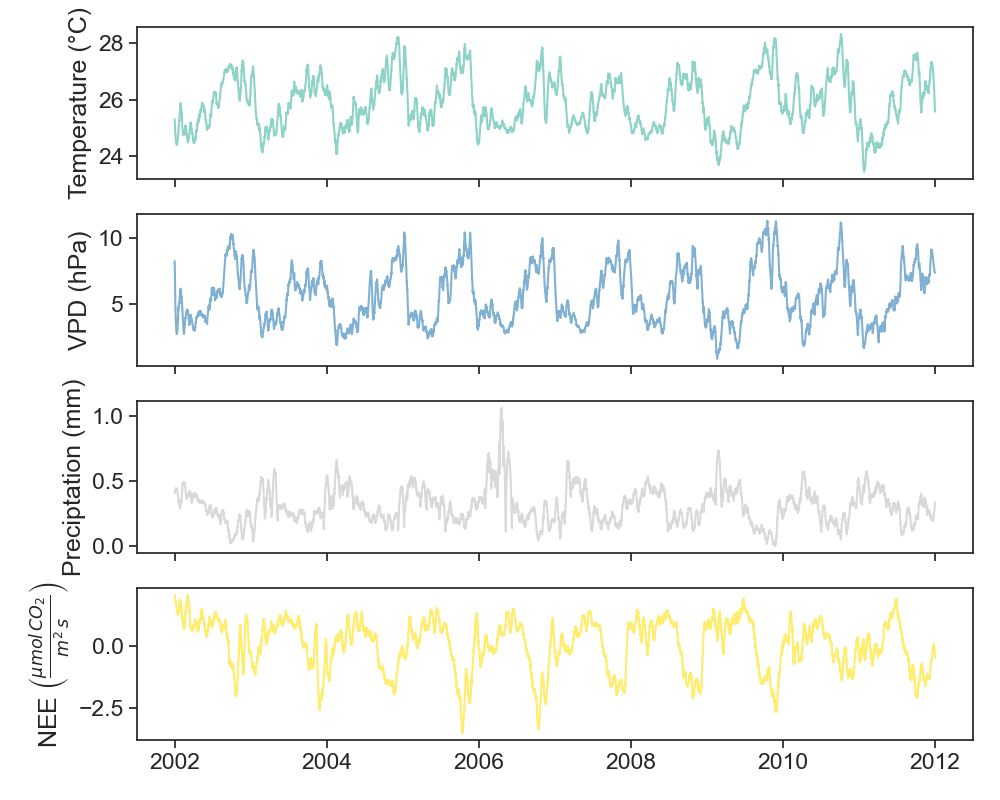

In [73]:
plot_all_columns(smoothed_df1)

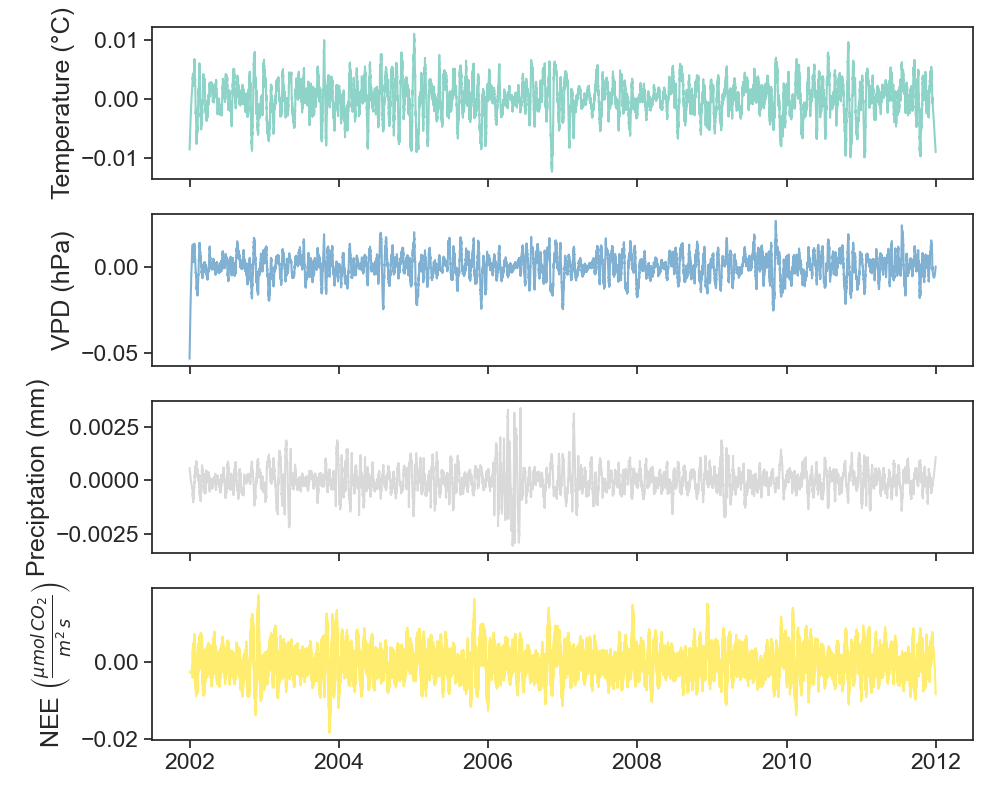

In [74]:
plot_all_columns(deriv_df)

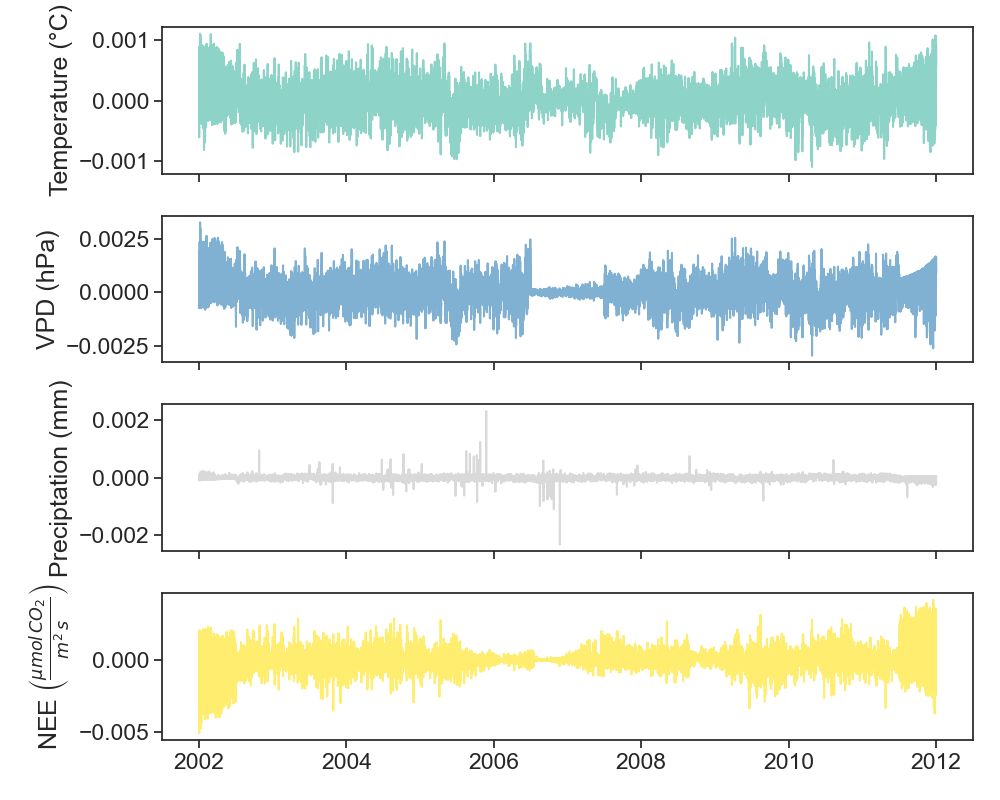

In [75]:
plot_all_columns(grad_df)

## Cross-Correlation

In [80]:
def standardized_data(data):
    # standardize data to have mean=0 and standard_deviation=1
    return (data - data.mean())/ data.std()

In [79]:
# function for plotting two standardized series
def plot_standardized_data(var1, var2, data):
       s1 = standardized_data(data[var1])
       s2 = standardized_data(data[var2])
       
       fig, ax = plt.subplots(figsize=(10,7))
       ax.plot(data.index, s1, label=var1)
       ax.plot(data.index, s2, label=var2, zorder=0)
       ax.set(xlabel="time",
              ylabel="signal")
       locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
       formatter = mdates.ConciseDateFormatter(locator)
       ax.xaxis.set_major_locator(locator)
       ax.xaxis.set_major_formatter(formatter)
       ax.legend(frameon=False)

In [78]:
# function for plotting the cross-correlation function vs. the lags
def plot_cc(var1,var2,data):
        s1 = standardized_data(data[var1])
        s2 = standardized_data(data[var2])
        
        corr_np = signal.correlate(s1, s2) / len(data)
        lags = signal.correlation_lags(len(s1), len(s2))


        max_index = np.argmax(corr_np)
        fig, ax = plt.subplots()
        ax.plot(lags, corr_np, color="orange", label = "scipy.signal.correlate")


        ax.plot([lags[max_index]], [corr_np[max_index]], ls="None", marker="o", mfc="None", mew=3, ms=10)
        ax.text(lags[max_index]+35, corr_np[max_index]+0.04,
                f"lag = {lags[max_index]}, CC = {corr_np.max():.2f}", va="top", ha="left")
        ax.grid(True)
        ax.set(xlabel="lag (pts)",
        ylabel="cross correlation function",)

        return corr_np, lags

In [81]:
one_month = RF_df.loc['2004-01-01 00:00:00':'2004-01-31 00:00:00'] # take one month of the dataframe

### Temp vs. NEE

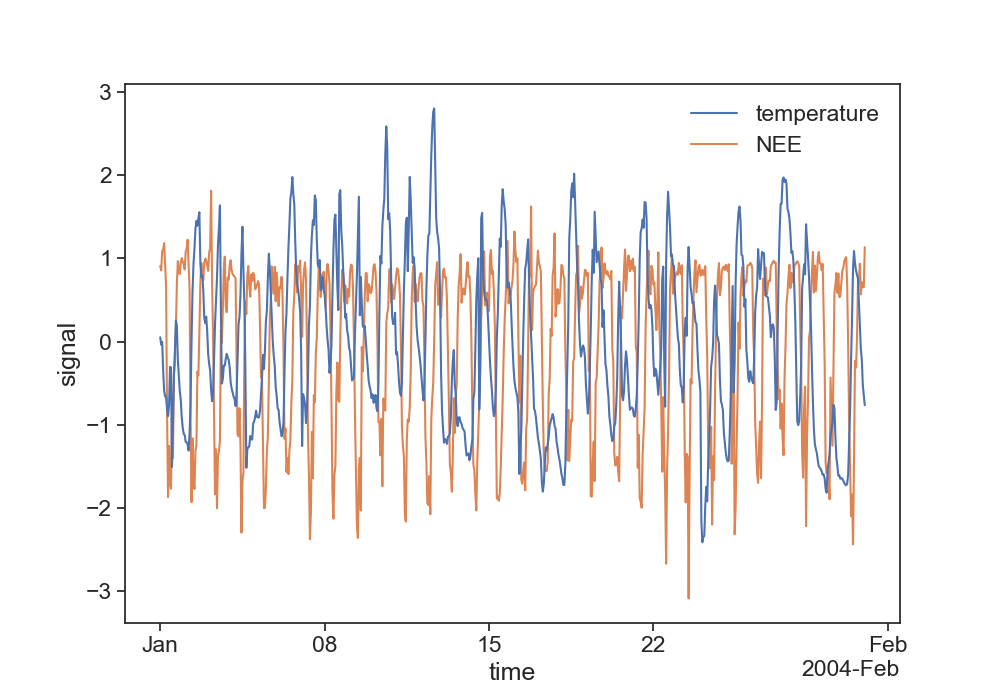

In [82]:
plot_standardized_data('temperature', 'NEE', one_month)

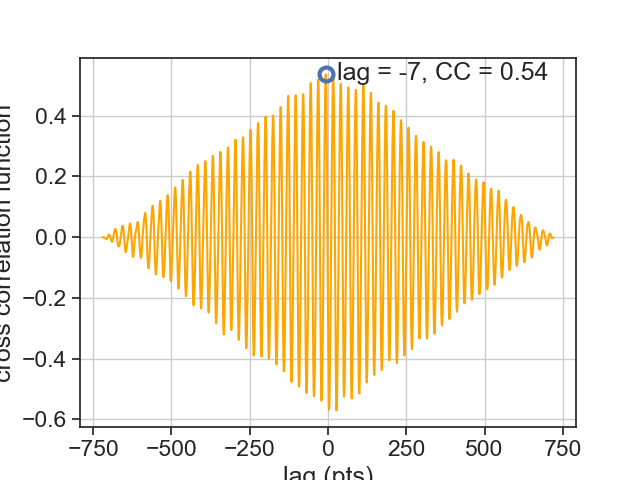

In [83]:
corr_np1, lags1 = plot_cc('temperature', 'NEE', one_month)

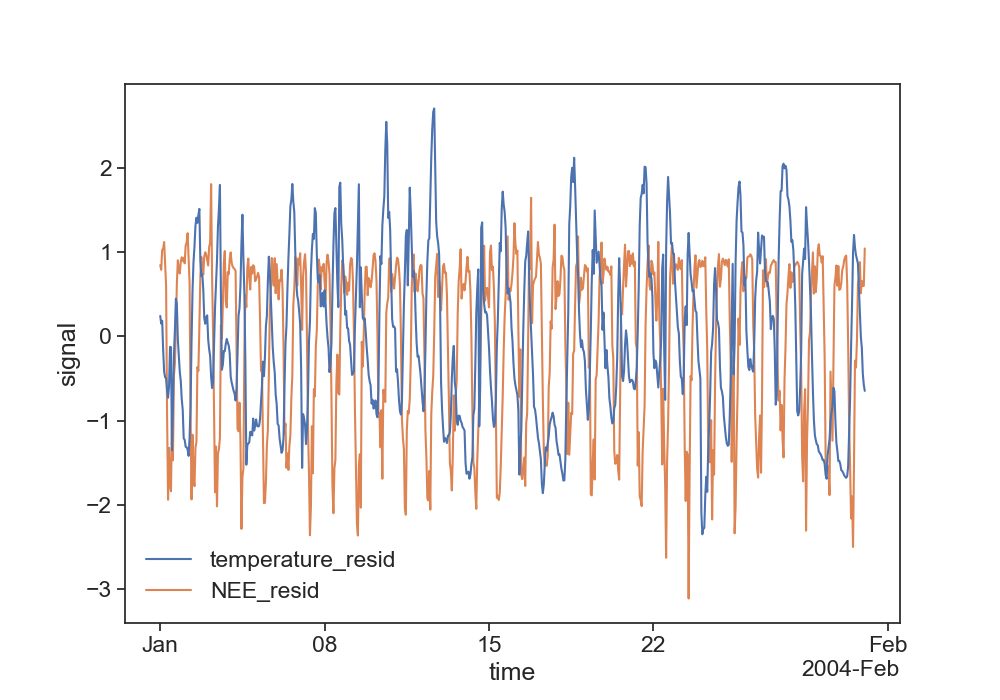

In [84]:
plot_standardized_data('temperature_resid', 'NEE_resid', df_season.loc['2004-01-01 00:00:00':'2004-01-31 00:00:00'])

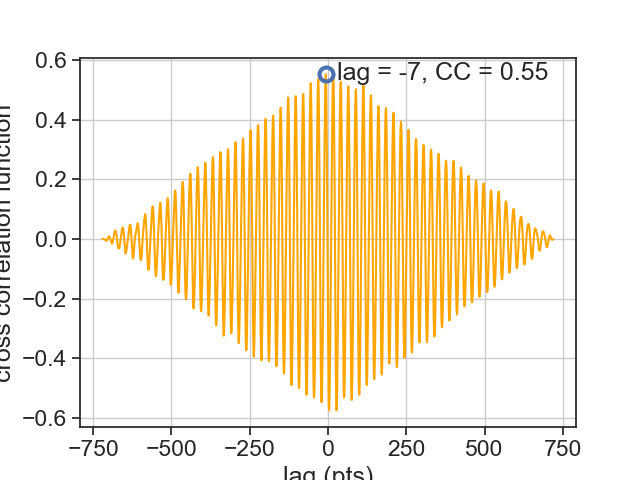

In [85]:
corr_np11, lags11 = plot_cc('temperature_resid', 'NEE_resid', df_season.loc['2004-01-01 00:00:00':'2004-01-31 00:00:00'])

### VPD vs. NEE

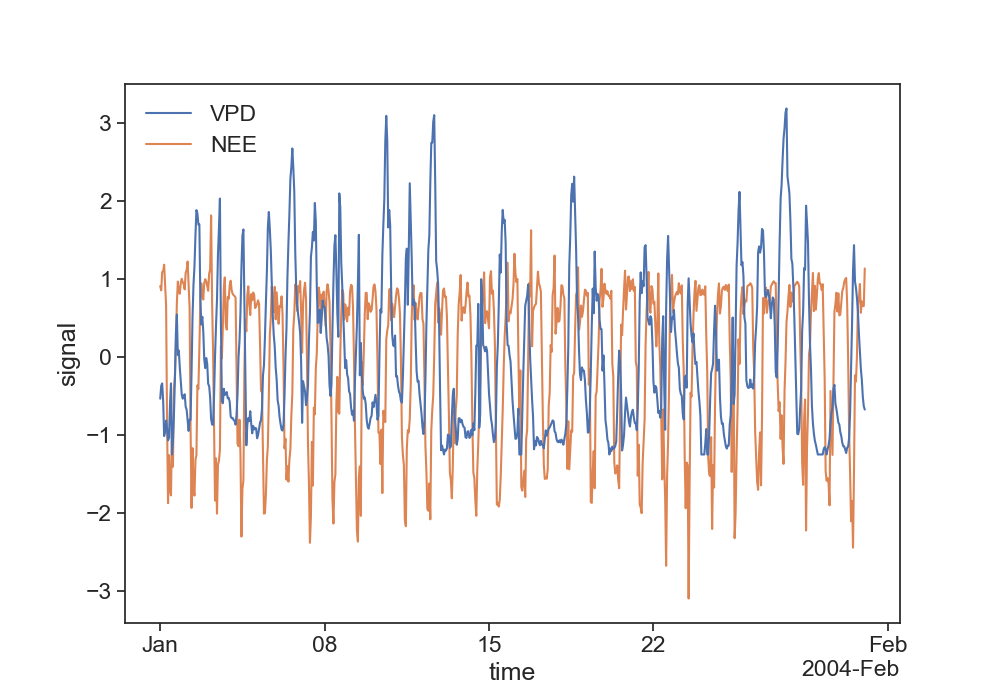

In [86]:
plot_standardized_data('VPD', 'NEE', one_month)

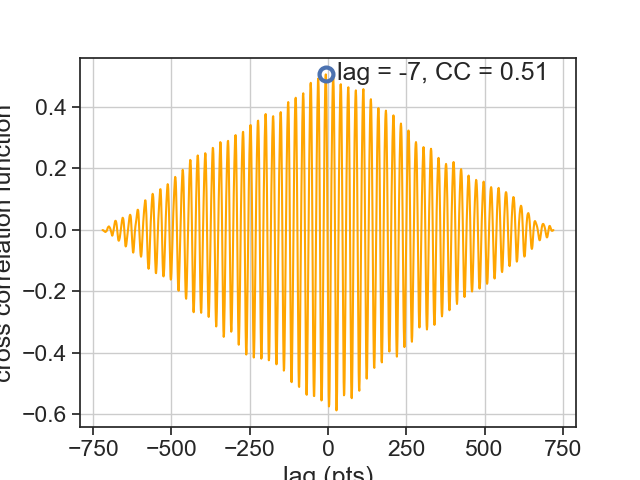

In [87]:
corr_np2, lags2 = plot_cc('VPD', 'NEE', one_month)

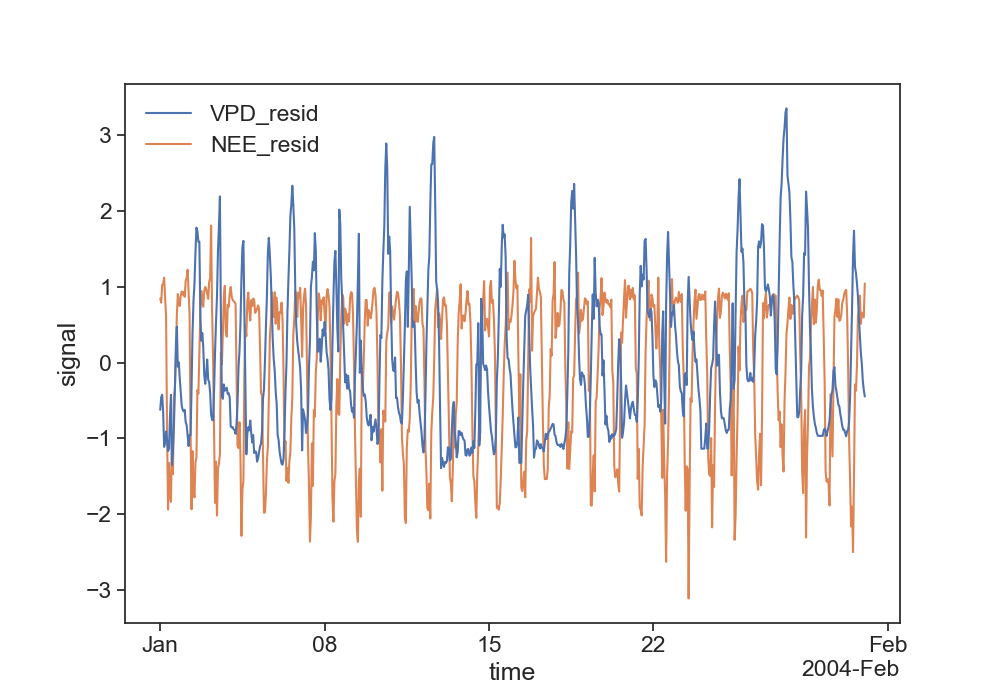

In [89]:
plot_standardized_data('VPD_resid', 'NEE_resid', df_season.loc['2004-01-01 00:00:00':'2004-01-31 00:00:00'])

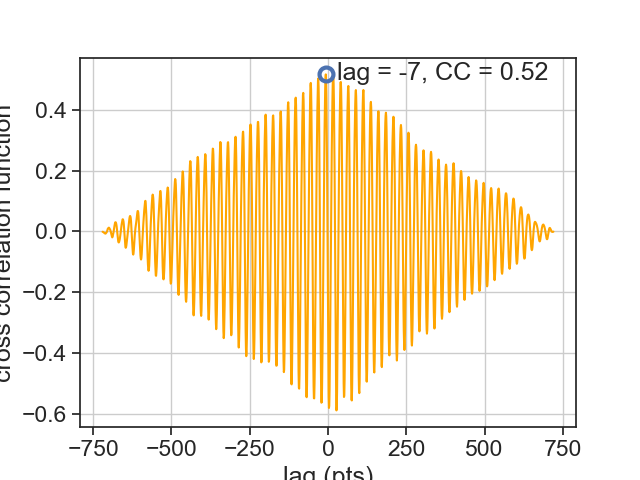

In [88]:
corr_np22, lags22 = plot_cc('VPD_resid', 'NEE_resid', df_season.loc['2004-01-01 00:00:00':'2004-01-31 00:00:00'])

### VPD vs. Temp

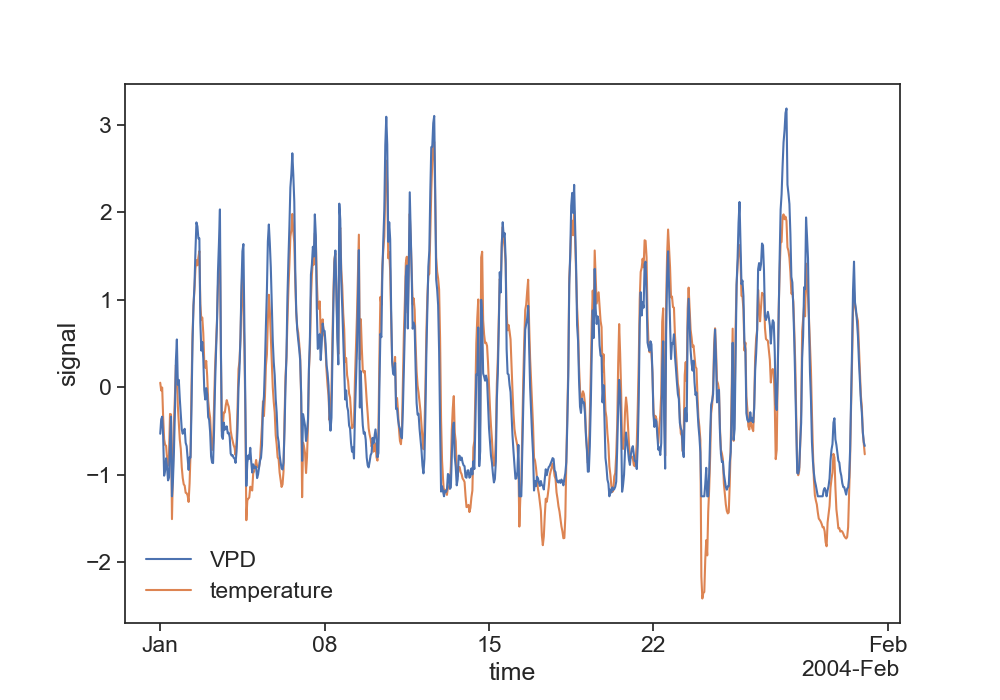

In [90]:
plot_standardized_data('VPD', 'temperature', one_month)

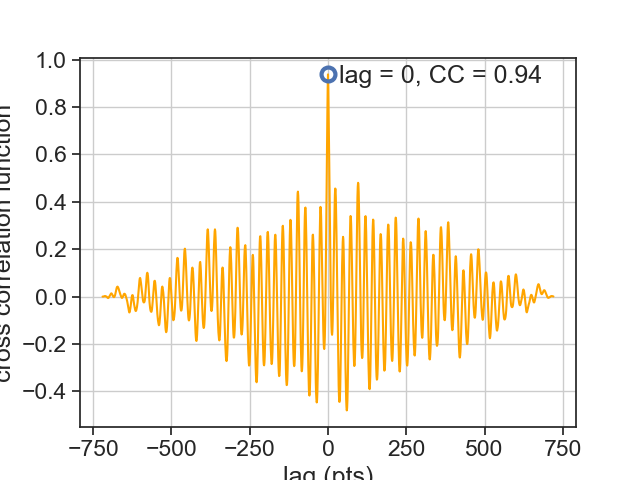

In [91]:
corr_np3, lags3 = plot_cc('temperature', 'VPD', one_month)

## Stationarity

In [92]:
NEE = RF_df['NEE'].loc['2003-01-01 00:00:00' : '2003-01-31 00:00:00'] # one month of NEE

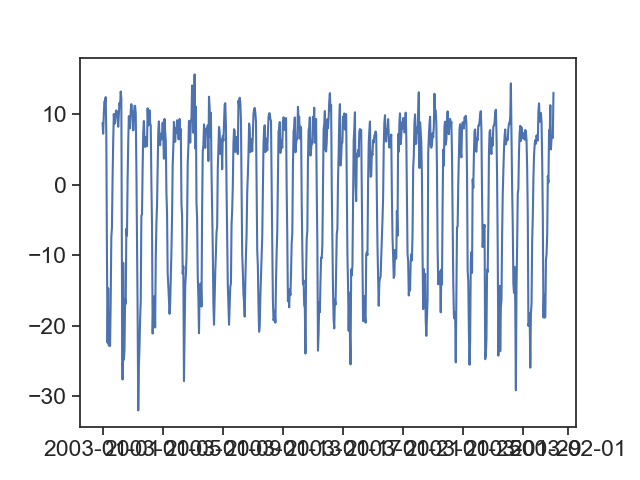

In [93]:
# plotting
fig, ax = plt.subplots()
ax.plot(NEE)

In [94]:
# Check if series is stationary with the ADF test
result = adfuller(NEE) # must be without nanas

print("ADF Statistic:", result[0])
print("p-value:", result[1])
if result[1] < 0.05:
    print("The series is stationary.")
else:
    print("The series is not stationary. Differencing is needed.")

ADF Statistic: -9.534184871365442
p-value: 2.8377137750590075e-16
The series is stationary.


## ACF, PACF, ARIMA

In [98]:
# Function for computing ACF 
def compute_acf(series):
    N = len(series)
    lags = np.arange(N)
    acf = np.zeros_like(lags)
    series = (series - series.mean()) / series.std()
    for i in lags:
        acf[i] = np.sum(series[i:] * series[:N-i])
    acf = acf / N
    return lags, acf

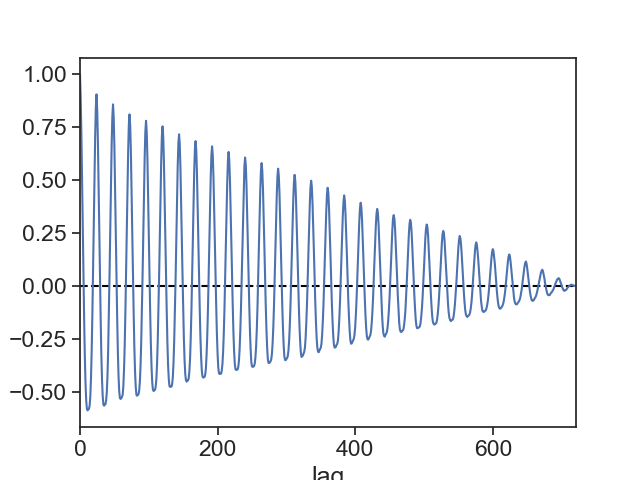

In [97]:
# plotting ACF 
fig, ax = plt.subplots()
lags, acf = compute_acf(NEE.values)
ax.plot([0, len(NEE)], [0]*2, color="black", ls="--")
ax.plot(lags, acf)
ax.set(xlabel="lag",
       ylabel="acf",
       xlim=[0, len(NEE)]);

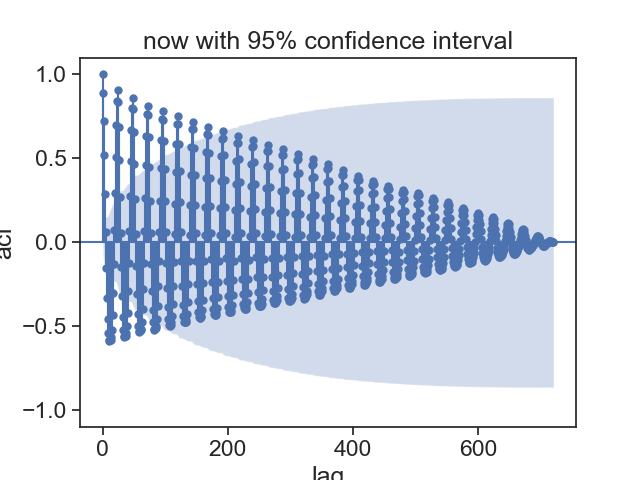

In [99]:
# Plotting ACF with confidence interval
fig, ax = plt.subplots()
sm.graphics.tsa.plot_acf(NEE.values,
                         lags=len(NEE)-1,
                         ax=ax,
                         alpha=.05    # 95% confidence interval
                         )

ax.set(ylim=[-1.1, 1.1],
       title="now with 95% confidence interval",
       xlabel="lag",
       ylabel="acf");

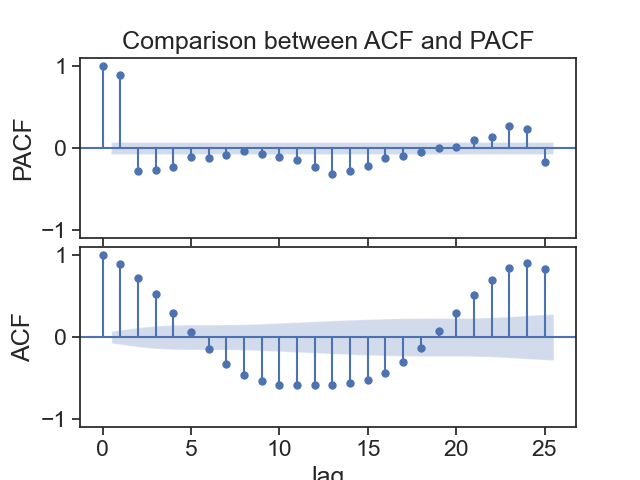

In [101]:
# Comparing the PACF and the ACF
fig, (ax1, ax2) = plt.subplots(2,1)
fig.subplots_adjust(hspace=0.05)
sm.graphics.tsa.plot_pacf(NEE.values, lags=25, ax=ax1, alpha=.05)
ax1.set(ylim=[-1.1, 1.1],
       title="Comparison between ACF and PACF",
       xlabel="lag",
       ylabel="PACF");

sm.graphics.tsa.plot_acf(NEE.values, lags= 25, ax=ax2, alpha=.05, title=None)
ax2.set(ylim=[-1.1, 1.1],
       xlabel="lag",
       ylabel="ACF");

In [102]:
from pmdarima import auto_arima

# Fit auto-ARIMA to find the best (p, d, q)
model = auto_arima(NEE, seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)
# try again with series1 and series2

print(model.summary())

# Use the recommended order
order = model.order

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=4142.488, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5489.647, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4367.732, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4874.527, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=4301.302, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4143.188, Time=0.11 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=4062.599, Time=0.51 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=4142.527, Time=0.18 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=4145.965, Time=0.33 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=4146.125, Time=0.25 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=4144.476, Time=0.13 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=4144.463, Time=0.23 sec
 ARIMA(4,0,3)(0,0,0)[0]             : AIC=4137.212, Time=0.73 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=4090.925, Time=0.87 sec

Best model:  ARIMA(3,0,2)(0,0,0)

We have an ARIMA(3,0,2) process!

In [103]:
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA model with correct order
model = ARIMA(NEE, order=(3,0,2))  # Replace 'order' with (p, d, q)
results = model.fit()
print(results.summary())

# Extract AR coefficients
ar_coeff = [1] + list(-results.arparams)  # Include 1 for ARIMA polynomial standard
ma_coeff = list(results.maparams)   
residual_std = np.std(results.resid)  
print("Fitted AR Coefficients:", ar_coeff)

c:\Users\nissan-lab\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\nissan-lab\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\nissan-lab\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                    NEE   No. Observations:                  721
Model:                 ARIMA(3, 0, 2)   Log Likelihood               -2018.452
Date:                Tue, 18 Feb 2025   AIC                           4050.904
Time:                        16:37:37   BIC                           4082.969
Sample:                    01-01-2003   HQIC                          4063.282
                         - 01-31-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.8141      0.223     -3.652      0.000      -1.251      -0.377
ar.L1          2.6195      0.029     90.427      0.000       2.563       2.676
ar.L2         -2.3324      0.056    -41.648      0.0

c:\Users\nissan-lab\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Let's create a synthetic time seires with the same ARIMA order

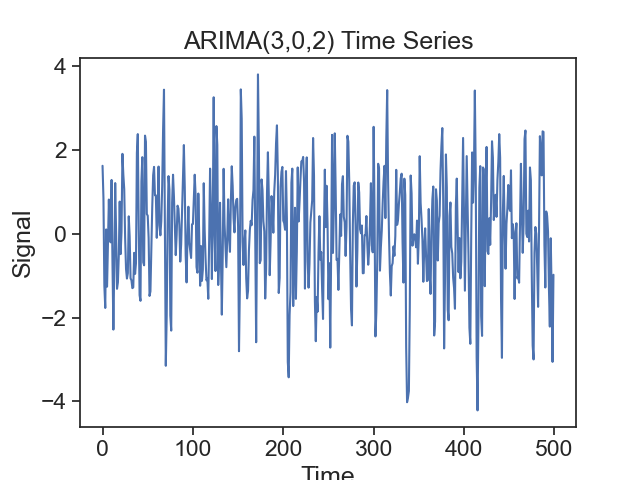

p-value:  4.2350184643031816e-16


In [104]:

# Set seed for reproducibility
np.random.seed(1)

# Define parameters for ARIMA(3,0,2)
N = 500
ar_params = [1, -0.5, 0.25, -0.1]  # AR coefficients
ma_params = [1, 0.4, -0.3]  # MA coefficients

# Generate ARIMA(3,0,2) process
arima_302 = sm.tsa.arma_generate_sample(ar=ar_params, ma=ma_params, nsample=N)

# Plot the generated time series
fig, ax = plt.subplots()
ax.plot(arima_302)
ax.set(xlabel="Time",
       ylabel="Signal",
       title="ARIMA(3,0,2) Time Series")
plt.show()

# Perform Augmented Dickey-Fuller test for stationarity
result = adfuller(arima_302)
print('p-value: ', result[1])

In [105]:
# Function to forecast missing values in an ARIMA(3,0,2) process
def arima_forecast(series, ar_coeff):
    s = series.copy()
    phi1 = -ar_coeff[1]
    phi2 = -ar_coeff[2]
    phi3 = -ar_coeff[3]
    start_index = np.argmax(np.isnan(s))
    for i in np.arange(start_index, len(series)):
        s[i] = phi1 * s[i-1] + phi2 * s[i-2] + phi3 * s[i-3] + np.random.normal()
    return s

# Introduce missing values
l = 380
missing = arima_302.copy()
missing[l:] = np.nan

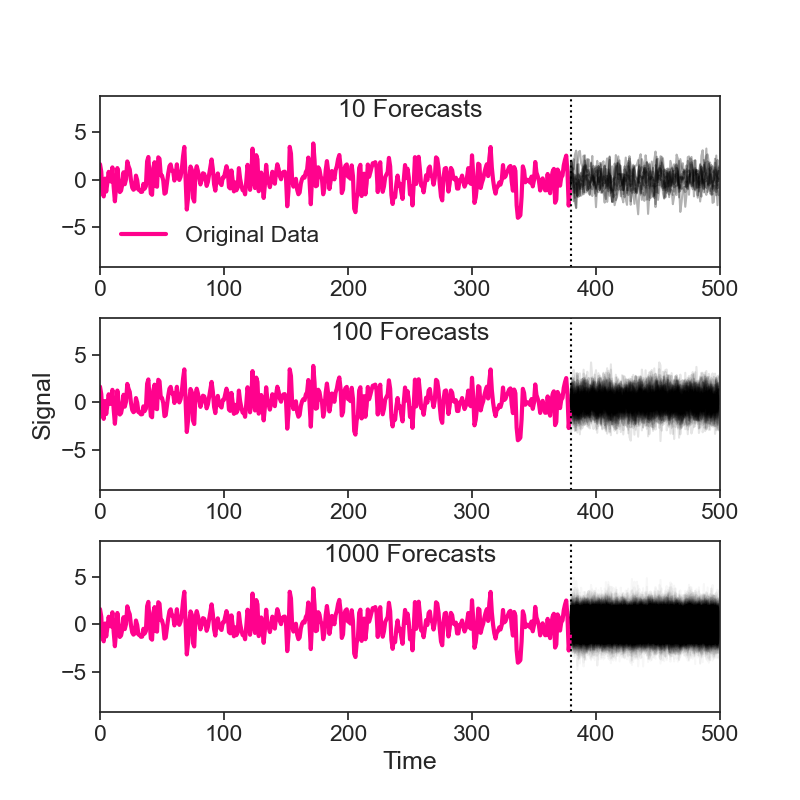

p-value:  4.2350184643031816e-16


In [106]:
# Plot multiple forecasts
fig, axes = plt.subplots(3, 1, figsize=(8, 8))
fig.subplots_adjust(hspace=0.3)

xlim = [0, len(missing)]
ylim = [min(arima_302)-5, max(arima_302)+5]

for idx, ntries in enumerate([10, 100, 1000]):
    ax = axes[idx]
    for i in range(ntries):
        np.random.seed(i)
        try_series = arima_forecast(missing, ar_params)
        ax.plot(try_series, color="black", alpha=0.3 if ntries == 10 else (0.1 if ntries == 100 else 0.03))
    ax.plot(arima_302[:l], color="xkcd:hot pink", lw=3, label="Original Data" if idx == 0 else "")
    ax.set(xlim=xlim, ylim=ylim, xlabel='Time' if idx == 2 else '', ylabel="Signal" if idx == 1 else '')
    ax.text(0.5, 0.98, f"{ntries} Forecasts", transform=ax.transAxes, ha="center", va="top")
    ax.plot([l]*2, ylim, color="black", ls=":")
    if idx == 0:
        ax.legend(frameon=False)

plt.show()

# Perform Augmented Dickey-Fuller test for stationarity
result = adfuller(arima_302)
print('p-value: ', result[1])
